# Ultrasonic Exploratory Data Analysis with Delay Sequence

This notebook will be exploring data from sensor using the version 2 platform.

The data collection procedure was as following



# Load Data

In [86]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random

In [87]:
def get_all_files_in_directory(root_directory):
    file_paths = []
    for root, dirs, files in os.walk(root_directory):
        for file in files:
            file_paths.append(os.path.join(root, file))
    return file_paths

In [88]:
def merge_csv_files(file_paths):
    """
    Merge multiple CSV files into a single DataFrame.

    Parameters:
    file_paths (list of str): List of file paths to the CSV files.

    Returns:
    DataFrame: Merged DataFrame containing data from all input CSV files.
    """
    dataframes = []
    for file in file_paths:
        df = pd.read_csv(file)
        dataframes.append(df)

    # Concatenate all DataFrames
    merged_df = pd.concat(dataframes, ignore_index=True)
    
    return merged_df

In [89]:
# Define the folder path
folder_path_malfunction = '../../ultra_sonic_sensor/fully_automate/data_v4.1.2'
file_paths_malfunction = get_all_files_in_directory(folder_path_malfunction)

# Define the folder path
folder_path = '../../ultra_sonic_sensor/fully_automate/data_v4.1.1'
file_paths = get_all_files_in_directory(folder_path_malfunction)

In [90]:
# Merge CSV files
all_df = merge_csv_files(file_paths)
all_df

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,Angle on XY plane,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
0,0,1692,13.46,767,16800,10440.0,1,102,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
1,1,1684,13.46,767,16800,10440.0,1,102,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
2,2,1748,14.44,823,16800,10440.0,1,102,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
3,3,1672,13.04,743,16800,10440.0,1,102,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
4,4,1664,13.11,747,16800,10440.0,1,102,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29245,45,8228,51.21,2919,3000,0.0,1,95,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
29246,46,8228,51.21,2919,3000,0.0,1,95,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
29247,47,8232,51.21,2919,3000,0.0,1,95,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
29248,48,8228,51.21,2919,3000,0.0,1,95,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5


In [91]:
# Merge CSV files
malfunction_df = merge_csv_files(file_paths_malfunction)
mal_list = malfunction_df["Sensor ID"].unique().tolist()
mal_og_df = all_df[all_df["Sensor ID"].isin(mal_list)]

In [92]:
# Add suffix to Sensor ID in all_df
mal_og_df['Sensor ID'] = mal_og_df['Sensor ID'].astype(str) + '_1'

# Add suffix to Sensor ID in malfunction_df
malfunction_df['Sensor ID'] = malfunction_df['Sensor ID'].astype(str) + '_2'

merged_df = pd.concat([mal_og_df, malfunction_df], ignore_index=True)
merged_df

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,Angle on XY plane,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm)
0,0,1692,13.46,767,16800,10440.0,1,102_1,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
1,1,1684,13.46,767,16800,10440.0,1,102_1,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
2,2,1748,14.44,823,16800,10440.0,1,102_1,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
3,3,1672,13.04,743,16800,10440.0,1,102_1,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
4,4,1664,13.11,747,16800,10440.0,1,102_1,13,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58495,45,8228,51.21,2919,3000,0.0,1,95_2,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
58496,46,8228,51.21,2919,3000,0.0,1,95_2,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
58497,47,8232,51.21,2919,3000,0.0,1,95_2,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5
58498,48,8228,51.21,2919,3000,0.0,1,95_2,53,0.8,...,0,18.3,18.3,0,0,HTR,90,wood,31,30.5


In [93]:
merged_df.columns

Index(['Trial', 'Ping Duration', 'Distance (cm)', 'Ping Time (us)',
       'Delay (us)', 'Steps', 'Arduino ID', 'Sensor ID', 'Range (cm)',
       'Sensor length (cm)', 'Color of sensor', 'Angle on XY plane',
       'side a (cm)', 'side b (cm)', 'side c (cm)', 'Angle on YZ plane',
       'Sensor Configuration', 'Sensor Angle', 'Surface material',
       'Surface Length (cm)', 'Surface Width (cm)'],
      dtype='object')

### Investigate Null

In [94]:
# Step 1: Check for NaNs
nan_columns = merged_df.isnull().any()

# Step 2: Filter Columns with NaNs
columns_with_nans = nan_columns[nan_columns].index.tolist()

# Print the result
print("Columns with NaNs:", columns_with_nans)

Columns with NaNs: []


Investigate Manually Inputted Datas

In [95]:
merged_df["Sensor ID"].unique()

array(['102_1', '106_1', '107_1', '2_1', '47_1', '6_1', '75_1', '77_1',
       '84_1', '85_1', '93_1', '94_1', '95_1', '102_2', '106_2', '107_2',
       '2_2', '47_2', '6_2', '75_2', '77_2', '84_2', '85_2', '93_2',
       '94_2', '95_2'], dtype=object)

In [96]:
merged_df["Range (cm)"].unique()

array([13, 18, 23, 28, 33, 38, 43, 48, 53], dtype=int64)

In [97]:
merged_df["Color of sensor"].unique()

array(['b'], dtype=object)

In [98]:
print(merged_df[merged_df["Color of sensor"] == "b" ]["Sensor ID"].unique())
print(merged_df[merged_df["Color of sensor"] == "B" ]["Sensor ID"].unique())
print(merged_df[(merged_df["Color of sensor"] != "b") & (merged_df["Color of sensor"] != "B")& (merged_df["Color of sensor"] != "g")]["Sensor ID"].unique())

['102_1' '106_1' '107_1' '2_1' '47_1' '6_1' '75_1' '77_1' '84_1' '85_1'
 '93_1' '94_1' '95_1' '102_2' '106_2' '107_2' '2_2' '47_2' '6_2' '75_2'
 '77_2' '84_2' '85_2' '93_2' '94_2' '95_2']
[]
[]


In [99]:
merged_df[merged_df["Color of sensor"] == "B" ]["Range (cm)"].unique()

array([], dtype=int64)

Deal with NaNs

In [100]:
# Step 1: Identify Columns with NaNs
nan_columns = merged_df.columns[merged_df.isnull().any()]

# Step 2: Find Mode and Replace NaNs
for col in nan_columns:
    if merged_df[col].dtype == object:  # Check if the column is categorical
        mode_value = merged_df[col].mode()[0]  # Find the mode value (most frequent value)\
        merged_df[col].fillna(mode_value, inplace=True)  # Replace NaNs with the mode value


print(merged_df[(merged_df["Color of sensor"] != "b") & (merged_df["Color of sensor"] != "B")& (merged_df["Color of sensor"] != "g")]["Sensor ID"].unique())

[]


In [101]:
merged_df["Color of sensor"] = merged_df["Color of sensor"].str.lower()
merged_df["Color of sensor"].unique()

array(['b'], dtype=object)

This time we will only keeping delay of 16800,10000,8000,6000,3000

In [102]:
values_to_keep = [16800,10000,8000,6000,3000]
cleaned_df = merged_df[merged_df["Delay (us)"].isin(values_to_keep)]

In [103]:
cleaned_df["Delay (us)"].unique()

array([16800, 10000,  8000,  6000,  3000], dtype=int64)

In [104]:
cleaned_df.to_csv("../processed_data/all_data_v4-1-2.csv")

# Visual analysis on effect of delay and range on Ping Time 

### Visualization by Range

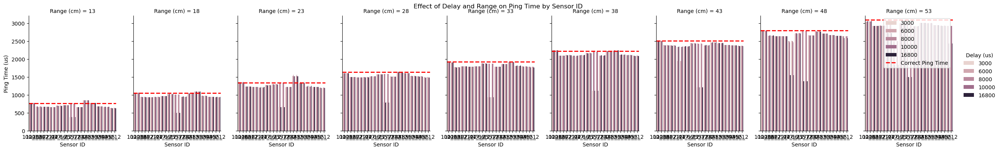

In [105]:
# Function to visualize the effect of delay and range on ping time
def visualize_delay_and_range_effect_on_ping_time_one(df):
    """
    Visualize the effect of delay and range on ping time.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    
    # Group by sensor ID, delay, and range, then calculate the mean ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])['Ping Time (us)'].mean().reset_index()
    
    # Create the visualization
    g = sns.catplot(
        x='Sensor ID', 
        y='Ping Time (us)', 
        hue='Delay (us)', 
        col='Range (cm)', 
        data=grouped_df, 
        kind='bar', 
        height=4, 
        aspect=0.7
    )
    
    # Add horizontal lines for correct ping times based on range
    for ax in g.axes.flatten():
        range_val = float(ax.get_title().split('=')[1].strip())
        correct_ping_time = (2 * range_val / 100) / 343 * 1e6
        ax.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
    
    plt.subplots_adjust(top=0.9)
    plt.suptitle('Effect of Delay and Range on Ping Time by Sensor ID')
    plt.legend()
    plt.show()


# Visualize the effect of delay and range on ping time
visualize_delay_and_range_effect_on_ping_time_one(cleaned_df)


we can see there are notable outliers present for each sensor in particular ranges. Most notable thing from this graph is sensor 4 where sometime it gives over and under measurement while it is on delay 16800. Later will be printing bigger graph to investigate this further. 

So far there are some distinct characteristics been catured and this will later be captured through machine learning method for characterization. 

In [106]:
# Function to visualize the effect of delay and range on ping time
def visualize_delay_and_range_effect_on_ping_time(df, target = 0):
    """
    Visualize the effect of delay and range on ping time.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Group by sensor ID, delay, and range, then calculate the mean ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])['Ping Time (us)'].mean().reset_index()
    # Create individual plots for each range
    unique_ranges = grouped_df['Range (cm)'].unique()
    
    if target == 0:
        for range_val in unique_ranges:
            subset_df = grouped_df[grouped_df['Range (cm)'] == range_val]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Sensor ID', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            correct_ping_time = (2 * range_val / 100) / 343 * 1e6
            plt.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
            
            plt.title(f'Effect of Delay on Ping Time by Sensor ID for Range {range_val} cm')
            plt.xlabel('Sensor ID')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()
    else:
        if target in unique_ranges:
            subset_df = grouped_df[grouped_df['Range (cm)'] == target]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Sensor ID', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            correct_ping_time = (2 * target / 100) / 343 * 1e6
            plt.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
            
            plt.title(f'Effect of Delay on Ping Time by Sensor ID for Range {target} cm')
            plt.xlabel('Sensor ID')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()

This function will be generating graph in bigger scale for better analysis.

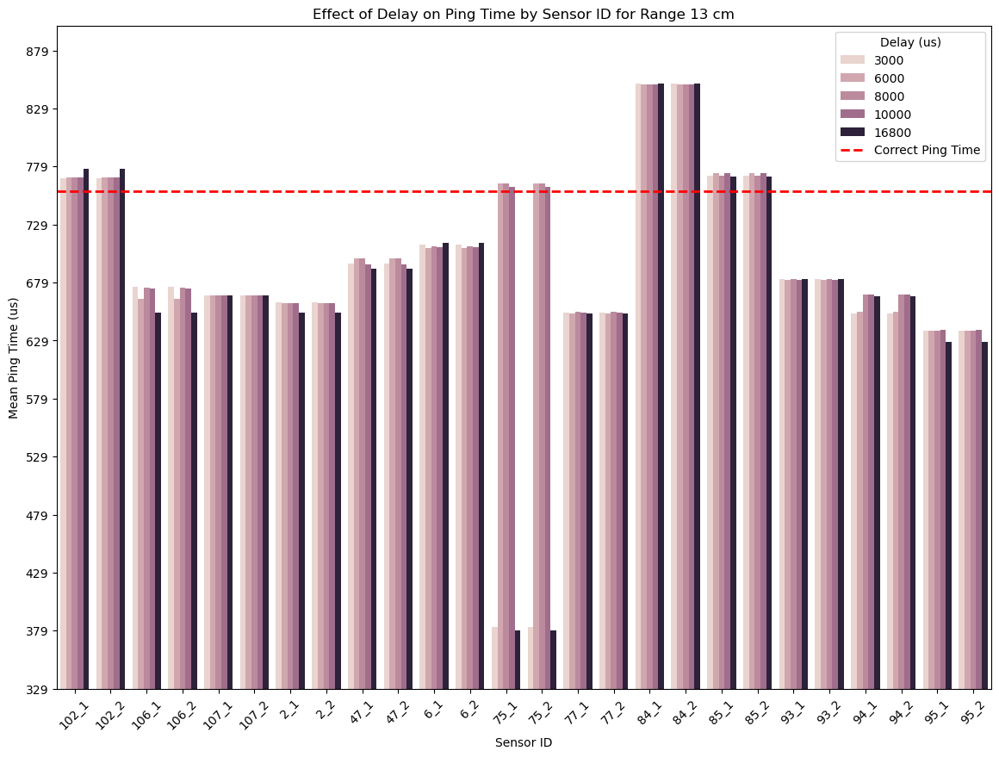

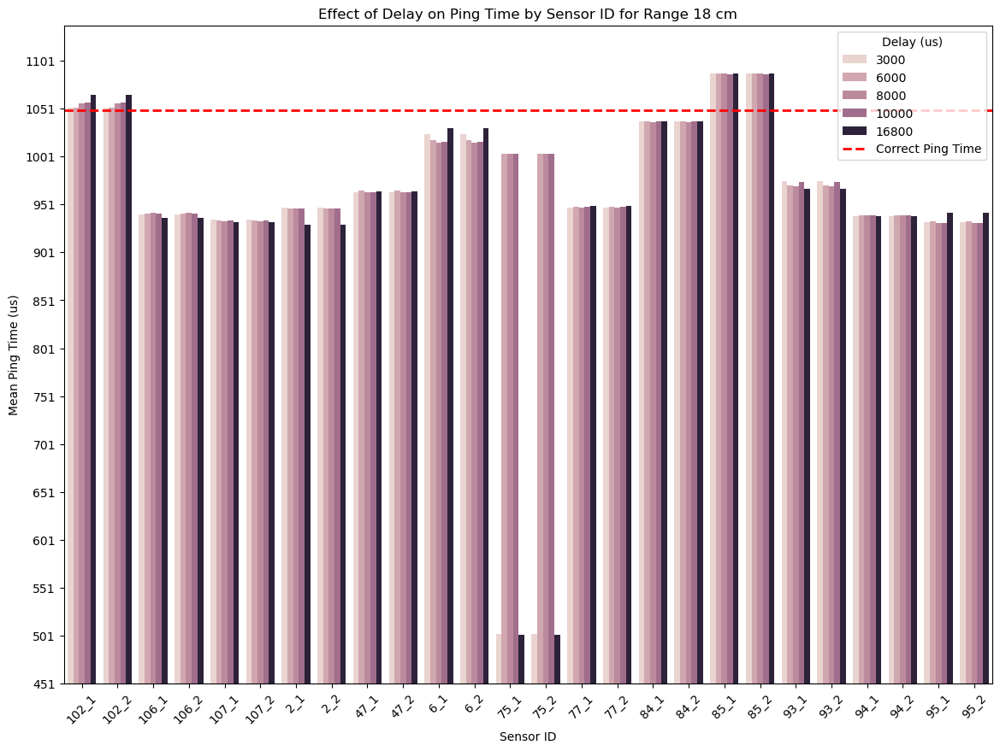

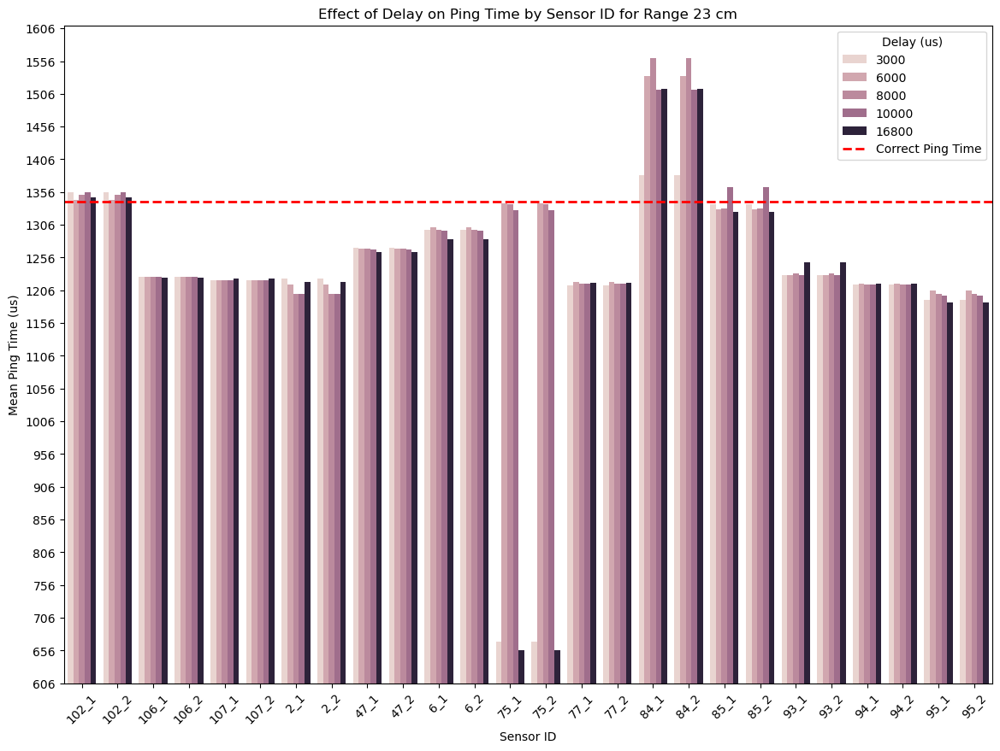

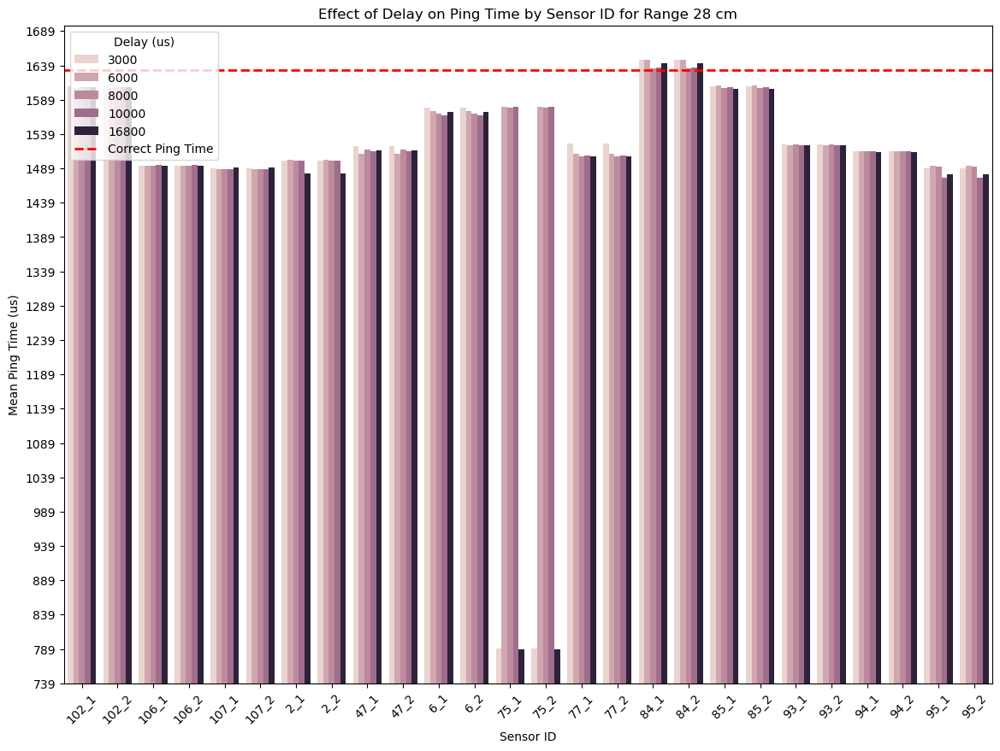

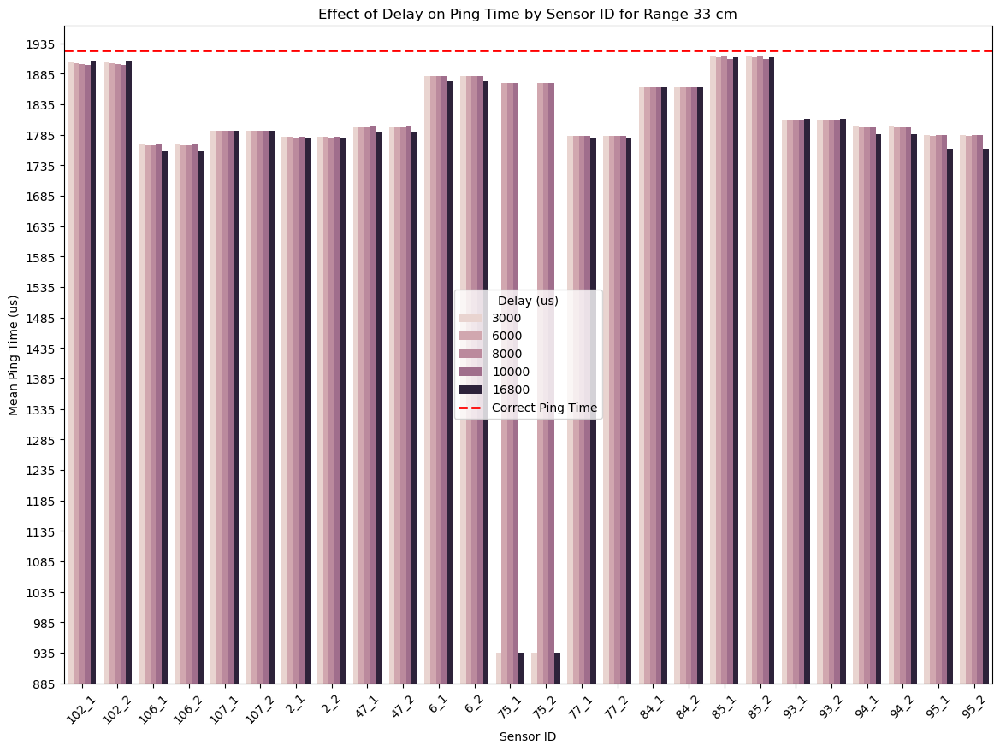

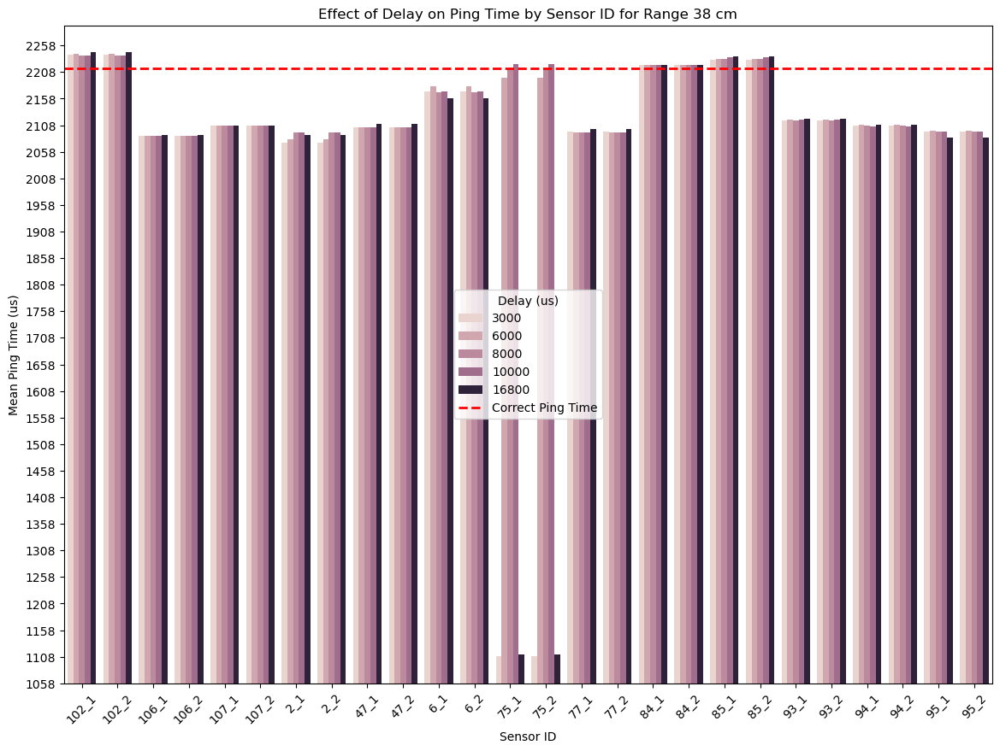

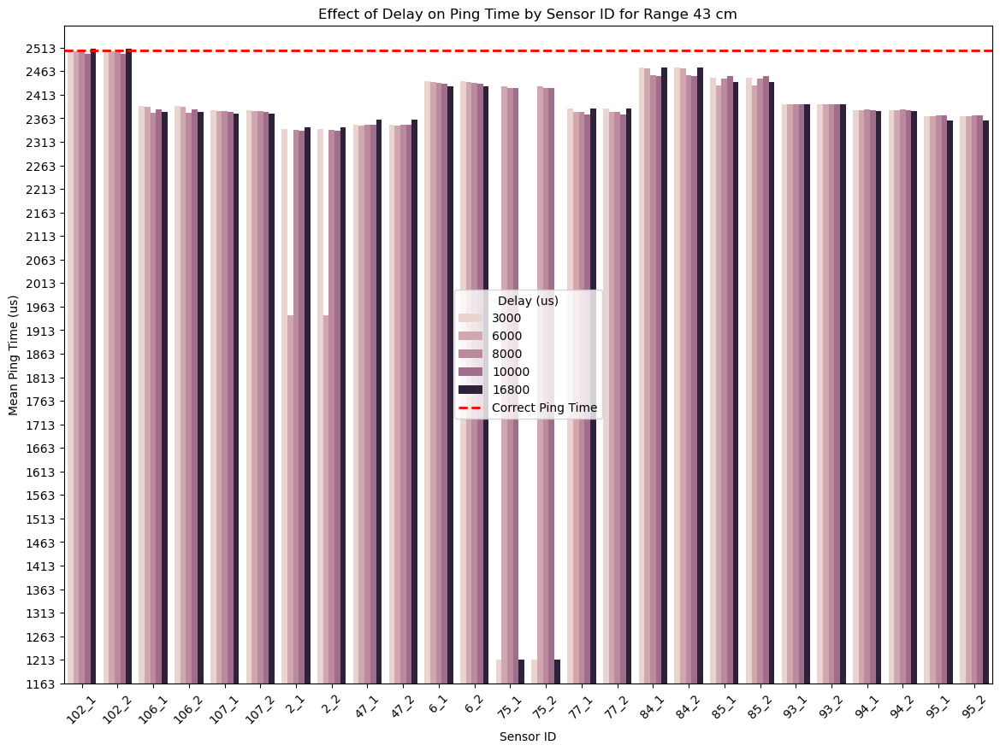

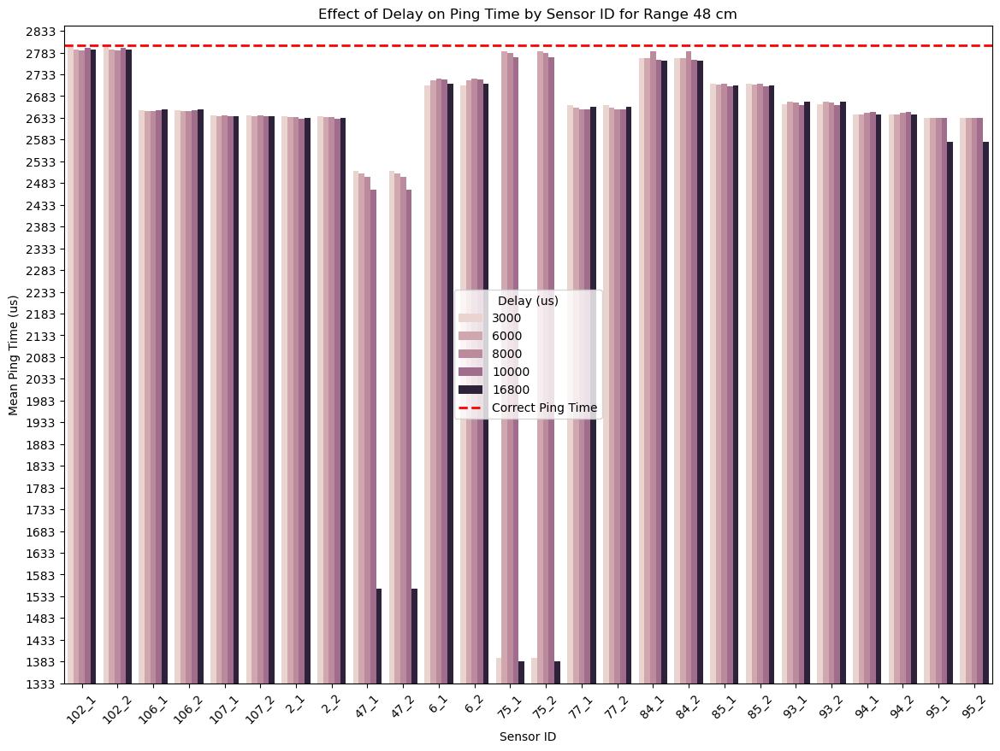

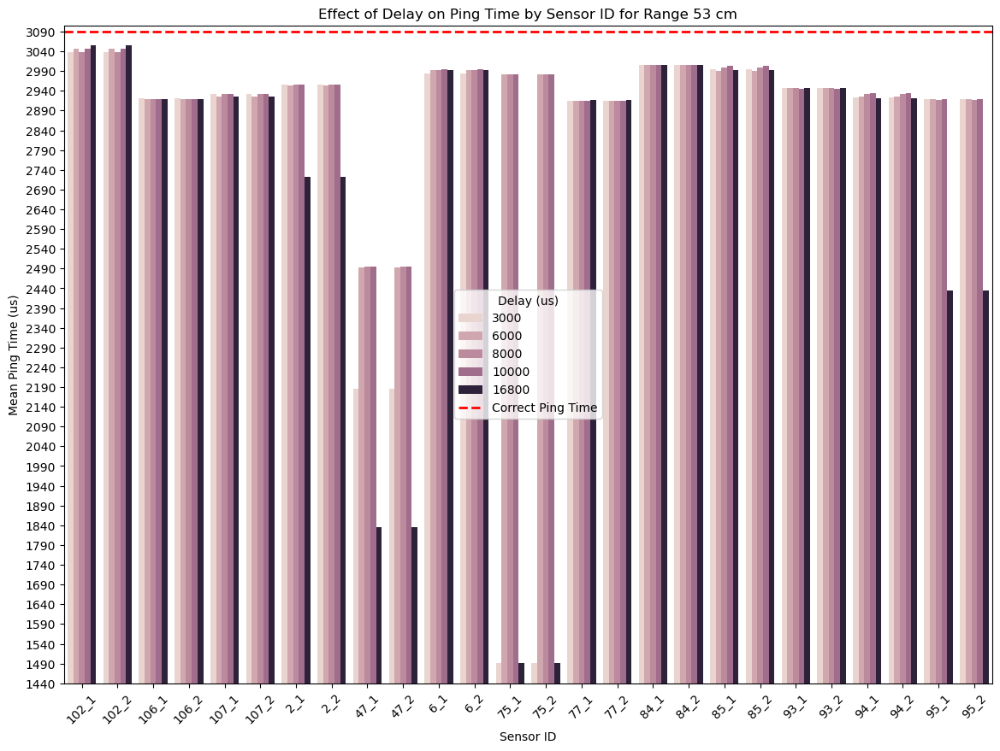

In [107]:
# Print all
visualize_delay_and_range_effect_on_ping_time(cleaned_df)

Things that standout:
1. At range 53 they seems to be struggling especially when delay is at 8000
2. There are some that over measurement but general trend is under measurement was prevalent
3. 16800us Delay seems to still give close enough data to the where the ping time should be
4. This may have been caused by the outlier since this is just a mean so we have to investigaste further

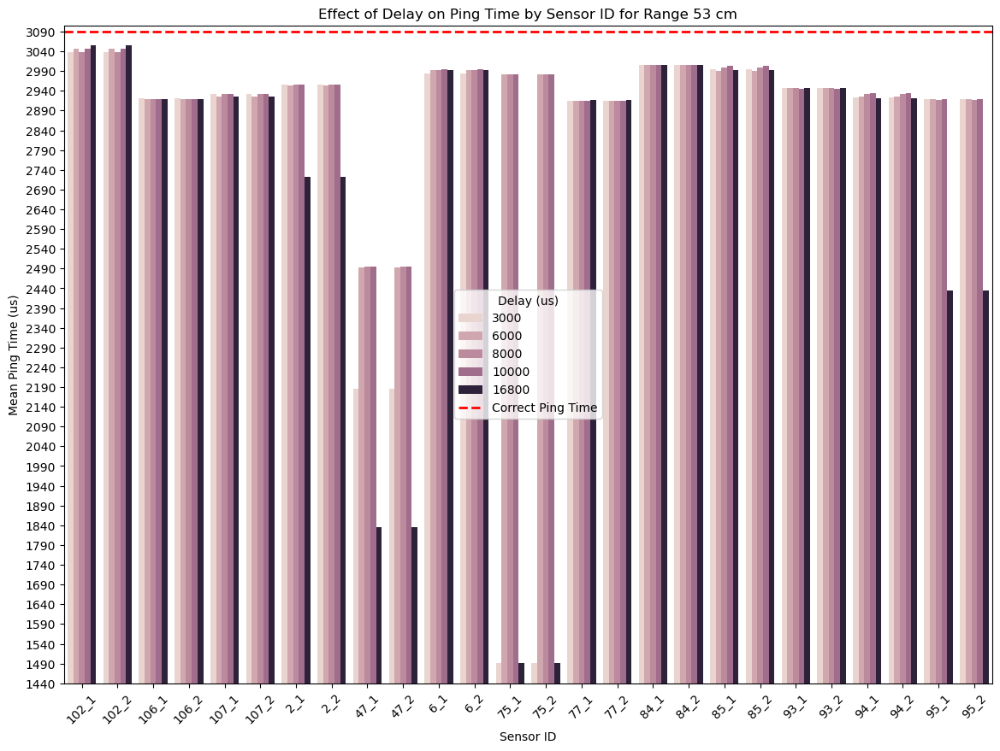

In [108]:
visualize_delay_and_range_effect_on_ping_time(cleaned_df, 53)

### Visualization by Sensor

Do another analysis based on sensors

In [109]:
# Function to visualize the effect of delay and range on ping time
def visualize_effect_on_ping_time_sensors(df, target = 0):
    """
    Visualize the effect of delay and range on ping time.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Group by sensor ID, delay, and range, then calculate the mean ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])['Ping Time (us)'].mean().reset_index()
    # Create individual plots for each range
    unique_sensors = grouped_df['Sensor ID'].unique()
    
    if target == 0:
        for id_val in unique_sensors:
            subset_df = grouped_df[grouped_df['Sensor ID'] == id_val]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Range (cm)', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            plt.title(f'Effect of Delay on Ping Time by Range on Sensor {id_val}')
            plt.xlabel('Range (cm)')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()
    else:
        if target in unique_sensors:
            subset_df = grouped_df[grouped_df['Sensor ID'] == target]
            plt.figure(figsize=(14, 10))
            sns.barplot(
                x='Range (cm)', 
                y='Ping Time (us)', 
                hue='Delay (us)', 
                data=subset_df
            )
            
            plt.title(f'Effect of Delay on Ping Time by Range on Sensor {target}')
            plt.xlabel('Range (cm)')
            plt.ylabel('Mean Ping Time (us)')
            plt.legend(title='Delay (us)')
            plt.xticks(rotation=45)
            # Adjust y-axis limits and ticks for better precision
            min_ping_time = subset_df['Ping Time (us)'].min()
            max_ping_time = subset_df['Ping Time (us)'].max()
            plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
            plt.yticks(range(int(min_ping_time) - 50, int(max_ping_time) + 50, 50))  # Adjust the step as needed
            plt.show()

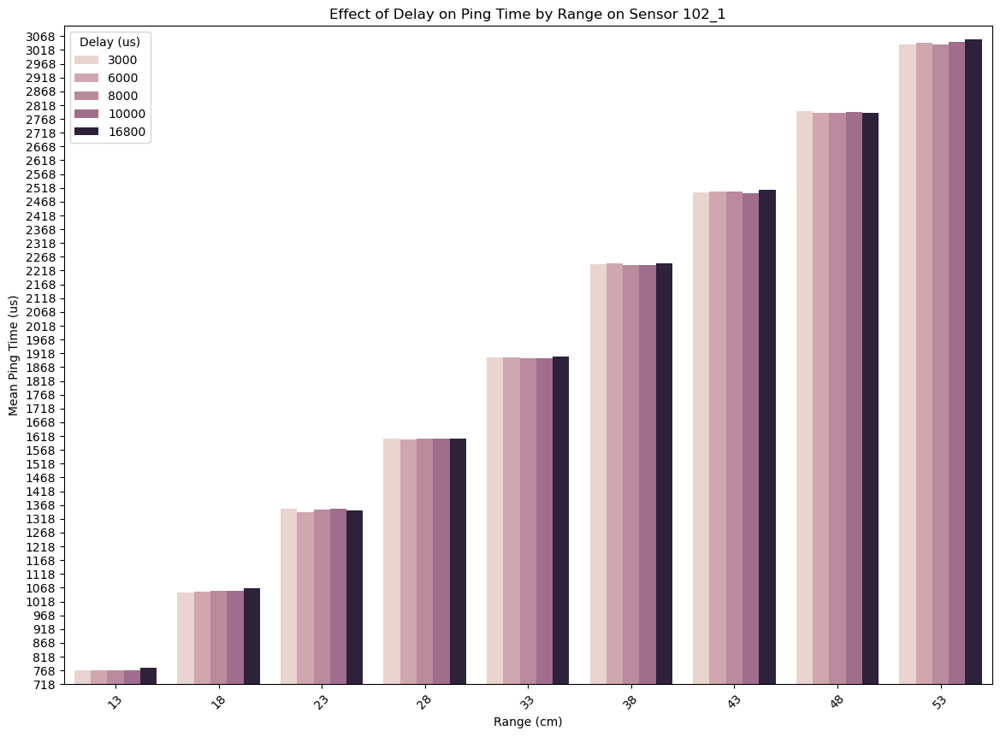

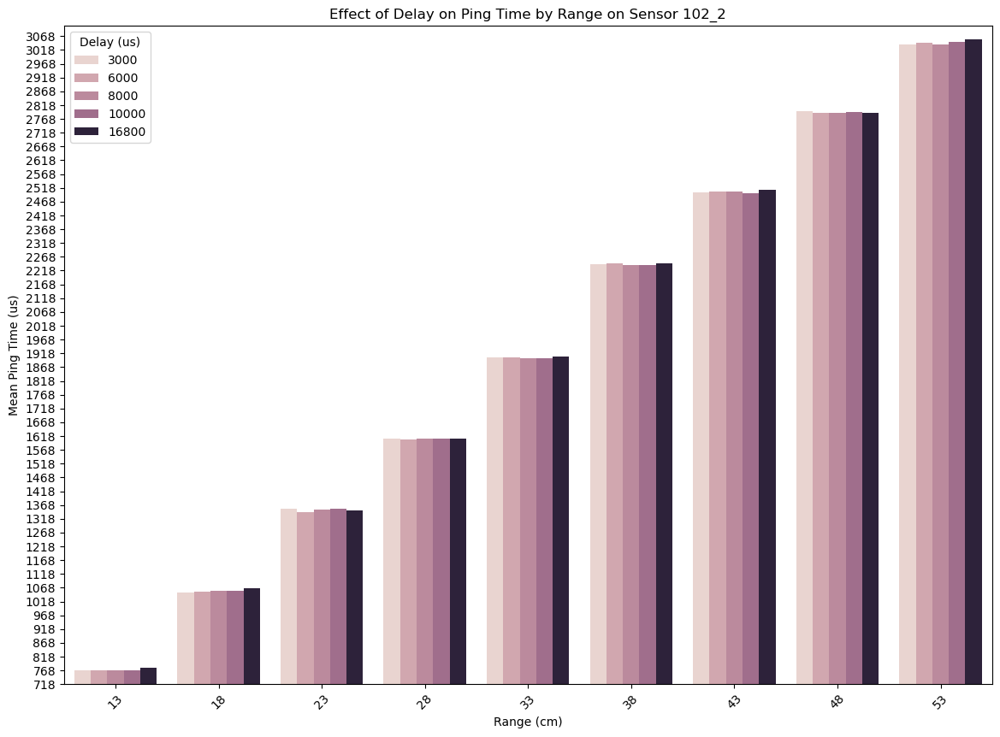

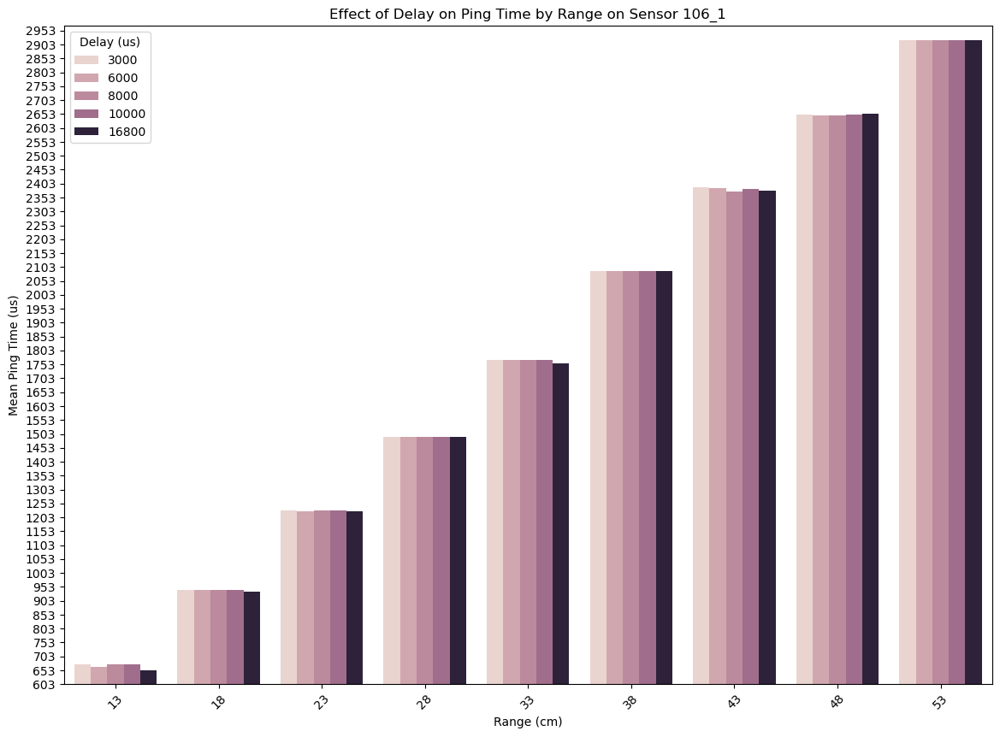

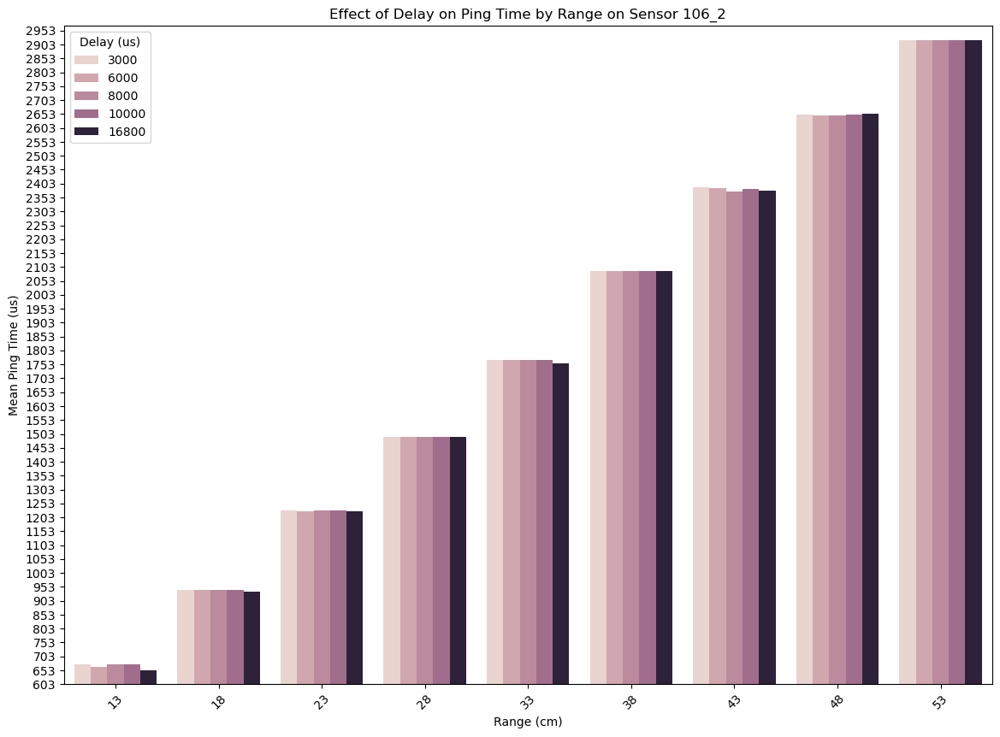

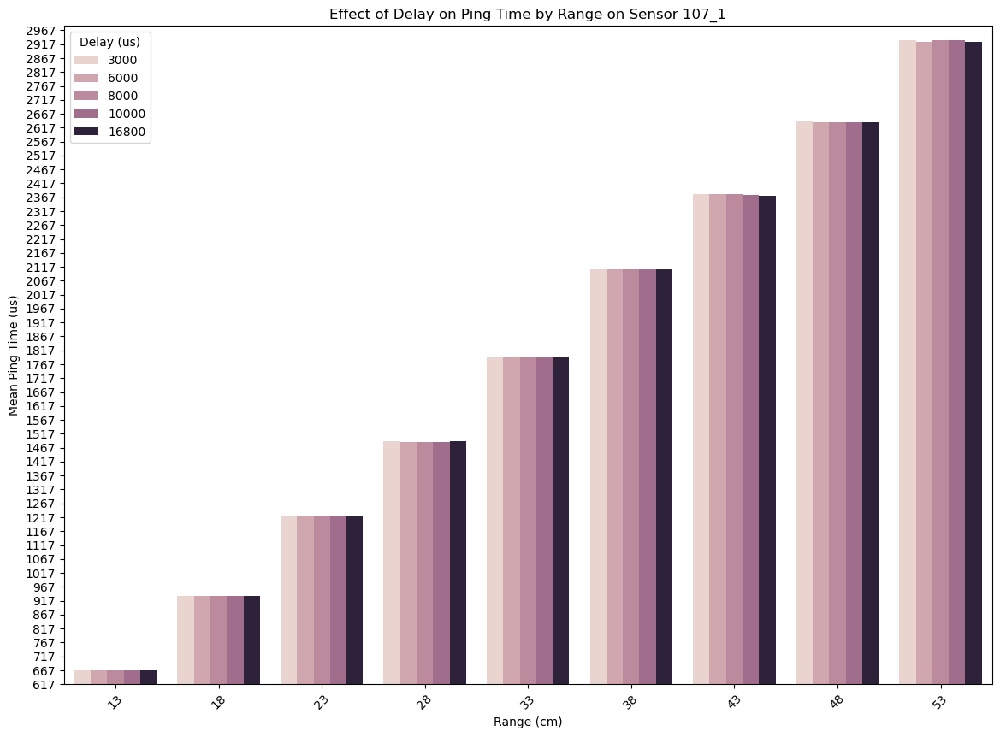

...

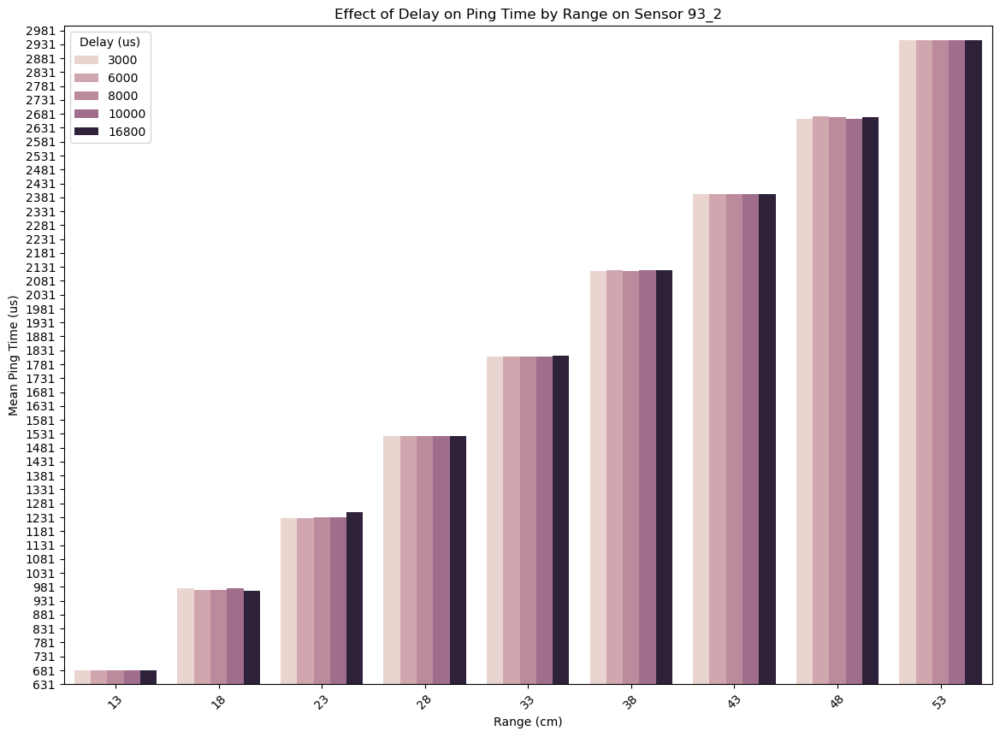

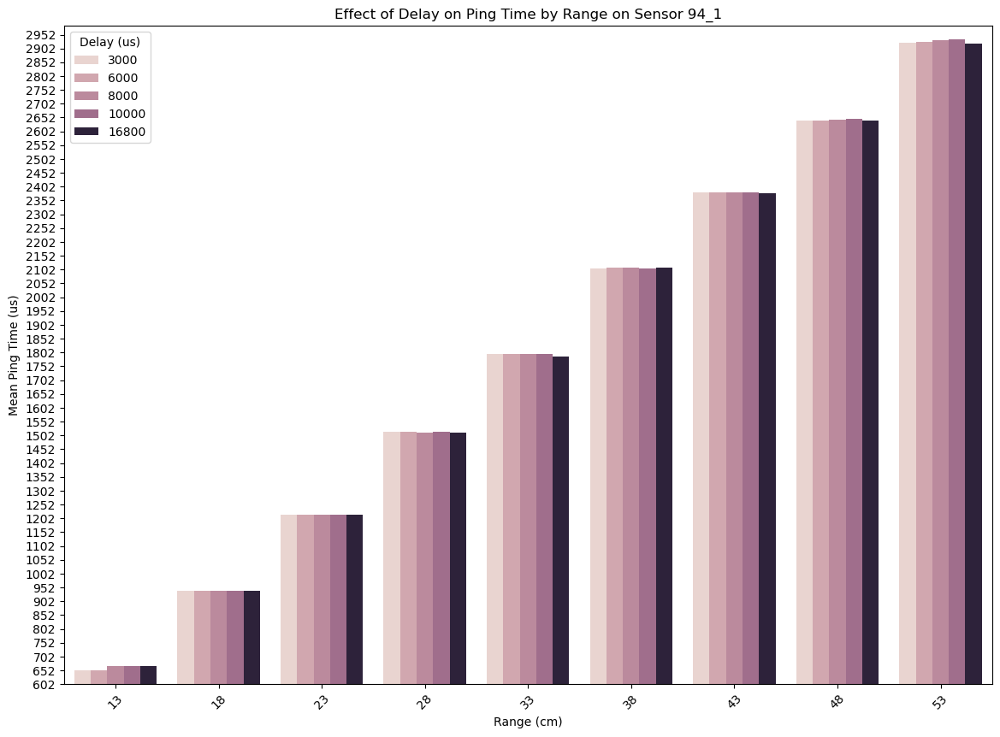

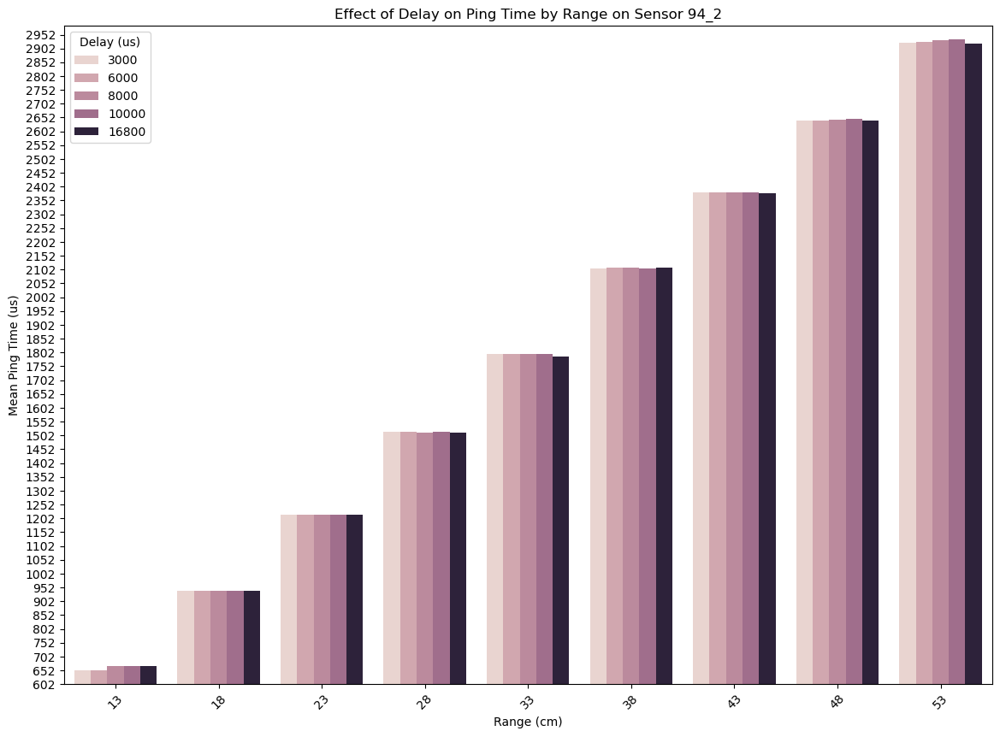

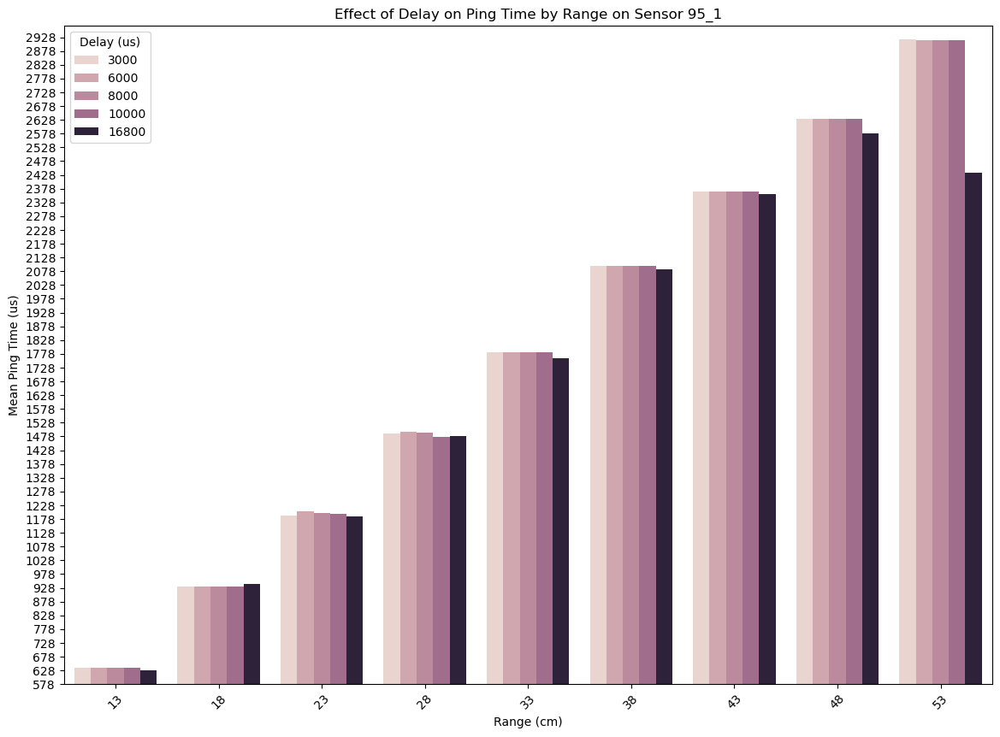

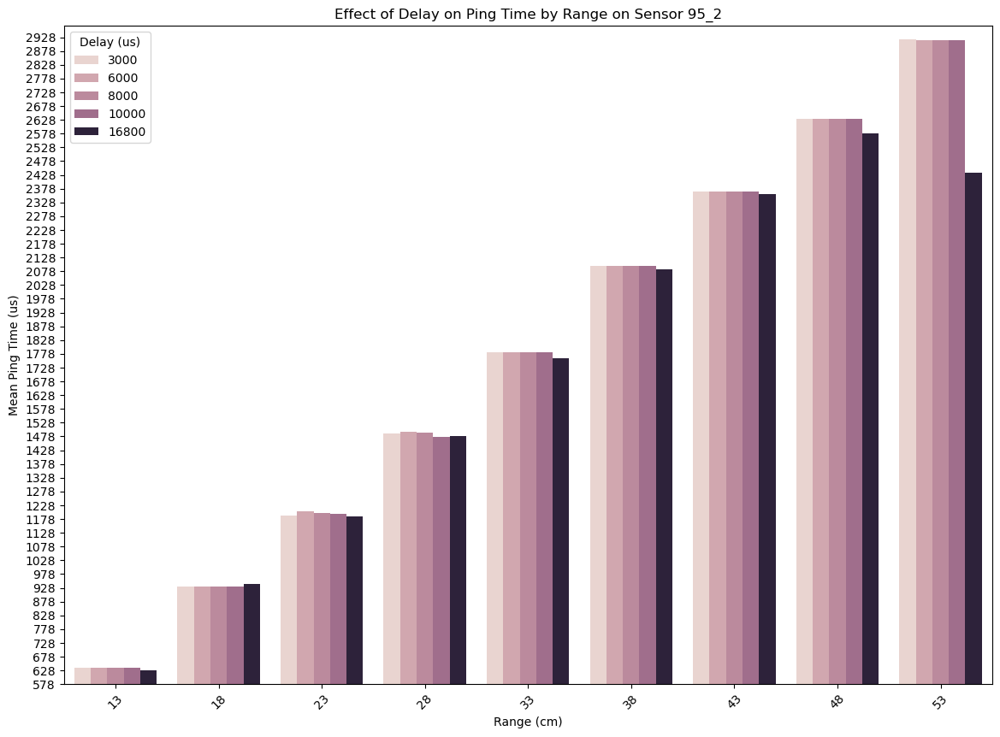

In [110]:
visualize_effect_on_ping_time_sensors(cleaned_df)

From these graph we can see that the each sensor have distinct graph shapes. This make the outlook of the project to characterize the sensor more promising.

### Line plot by range

This plot will show how they generally look of the measurement actually look like. This is also more effective to show linear relationship.

In [25]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

def visualize_lineplot_ping_time_with_variability(df):
    """
    Visualize the effect of range on ping time for each delay separately with variability.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Group by sensor ID, delay, and range, then calculate the mean and standard deviation of ping time
    grouped_df = df.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)']).agg(
        mean_ping_time=('Ping Time (us)', 'mean'),
        std_ping_time=('Ping Time (us)', 'std')
    ).reset_index()

    # Get unique delays
    unique_delays = grouped_df['Delay (us)'].unique()

    for delay in unique_delays:
        subset_df = grouped_df[grouped_df['Delay (us)'] == delay]

        fig = px.line(
            subset_df,
            x='Range (cm)',
            y='mean_ping_time',
            color='Sensor ID',
            markers=True,
            title=f'Effect of Range on Ping Time for Delay {delay} us with Variability'
        )

        # Adding error bars
        for sensor_id in subset_df['Sensor ID'].unique():
            sensor_data = subset_df[subset_df['Sensor ID'] == sensor_id]
            fig.add_trace(
                go.Scatter(
                    x=sensor_data['Range (cm)'],
                    y=sensor_data['mean_ping_time'],
                    mode='lines+markers',
                    name=f'Sensor {sensor_id}',
                    error_y=dict(
                        type='data',
                        array=sensor_data['std_ping_time'],
                        visible=True
                    )
                )
            )

        # Plot reference line
        ranges = np.linspace(subset_df['Range (cm)'].min(), subset_df['Range (cm)'].max(), 100)
        reference_ping_times = 57 * ranges
        fig.add_trace(
            go.Scatter(
                x=ranges,
                y=reference_ping_times,
                mode='lines',
                line=dict(color='red', dash='dash'),
                name='Reference Line'
            )
        )

        fig.update_layout(
            xaxis_title='Range (cm)',
            yaxis_title='Mean Ping Time (us)',
            legend_title='Sensor ID',
            template='plotly_white'
        )

        fig.show()

# Call the function to visualize the plot
visualize_lineplot_ping_time_with_variability(cleaned_df)


Observations on each delays

3000: every sensor except for 47 they seems to give consistent result 

6000: This delay give more variability where sensor 47 36, and 40 gave huge variability.

8000: there were huge variability and huge dip but this usually happened at the end of the range

10000: one of the most stable delay

16800: This delay also reveals characteristics of the sensor 

# Identifying outliers and doing outlier analysis


#### Visualize Box Plot

In [26]:
def visualize_stacked_box_plots(df):
    """
    Visualize the effect of range on ping time using stacked box plots for each delay.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Get unique delay values
    unique_ranges = df['Range (cm)'].unique()
    
    for range_val in unique_ranges:
        subset_df = df[df['Range (cm)'] == range_val]
        plt.figure(figsize=(16, 12))
        sns.boxplot(
            x='Sensor ID', 
            y='Ping Time (us)', 
            hue='Delay (us)', 
            data=subset_df
        )
        correct_ping_time = (2 * range_val / 100) / 343 * 1e6
        plt.axhline(correct_ping_time, color='red', linestyle='--', linewidth=2, label='Correct Ping Time')
                
        plt.title(f'Stacked Box Plot of Ping Time (us) Grouped by Delay (us) for Range {range_val} cm')
        plt.xlabel('Sensor ID')
        plt.ylabel('Ping Time (us)')
        plt.legend(title='Sensor ID', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True)
        plt.xticks(rotation=45)
        # Adjust y-axis limits for better precision
        min_ping_time = subset_df['Ping Time (us)'].min()
        max_ping_time = subset_df['Ping Time (us)'].max()
        plt.ylim(min_ping_time - 50, max_ping_time + 50)  # Adjust the limits as needed
        plt.show()

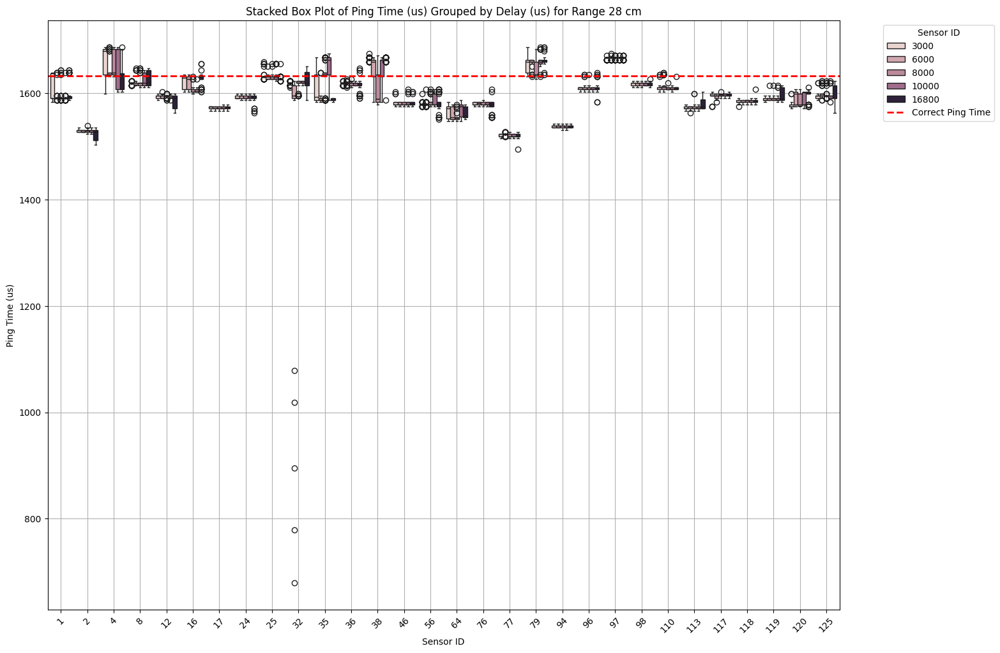

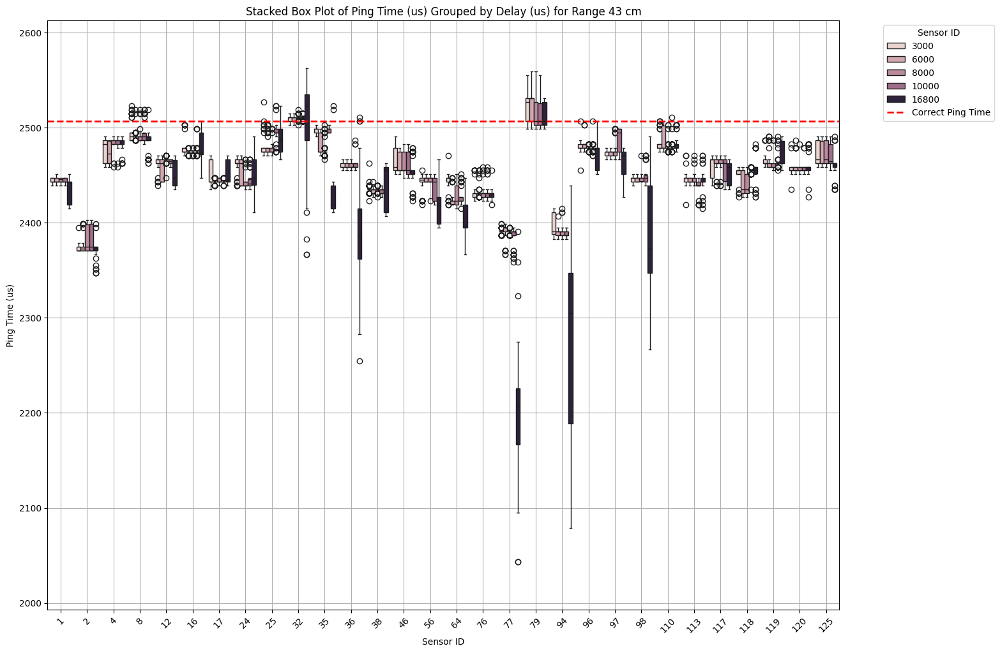

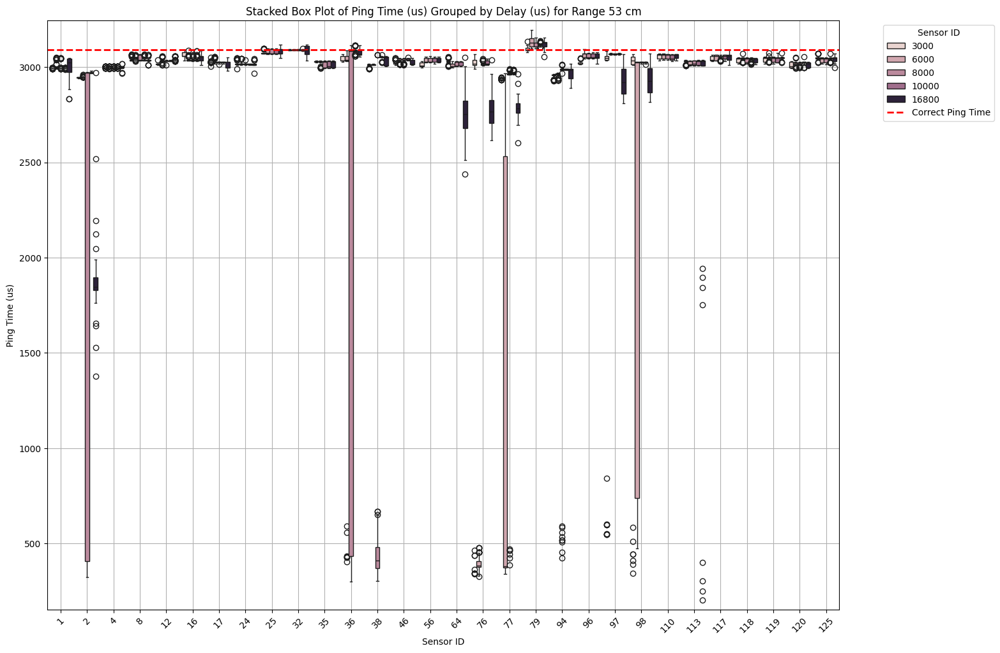

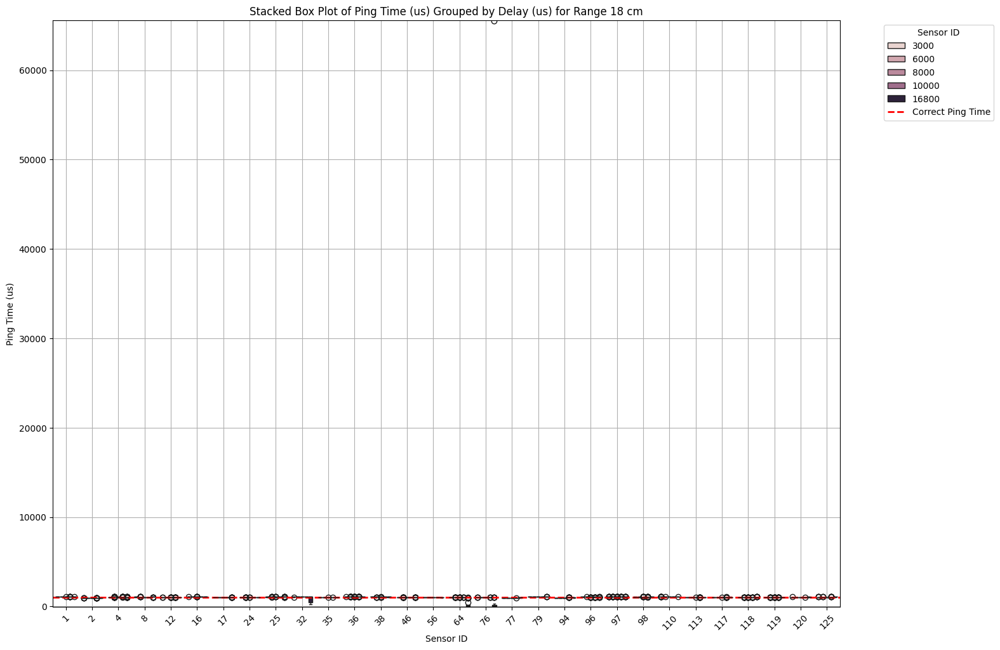

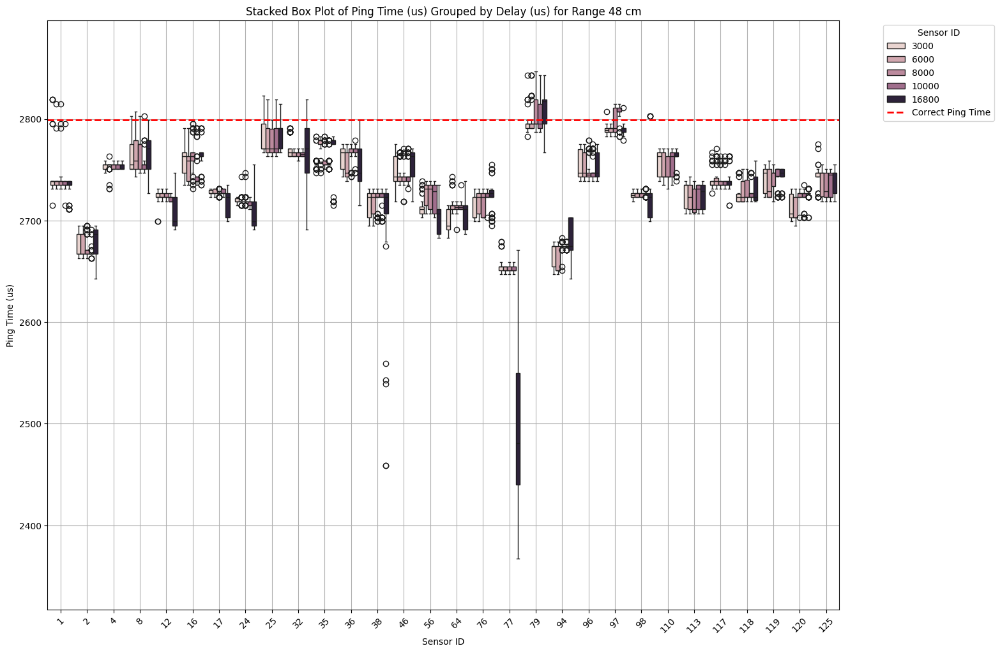

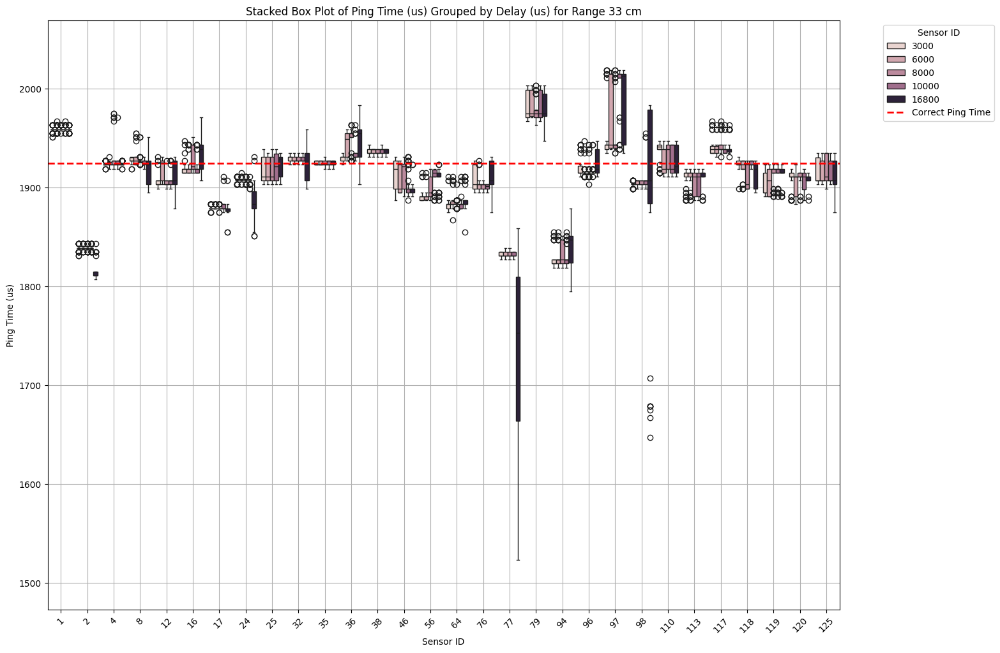

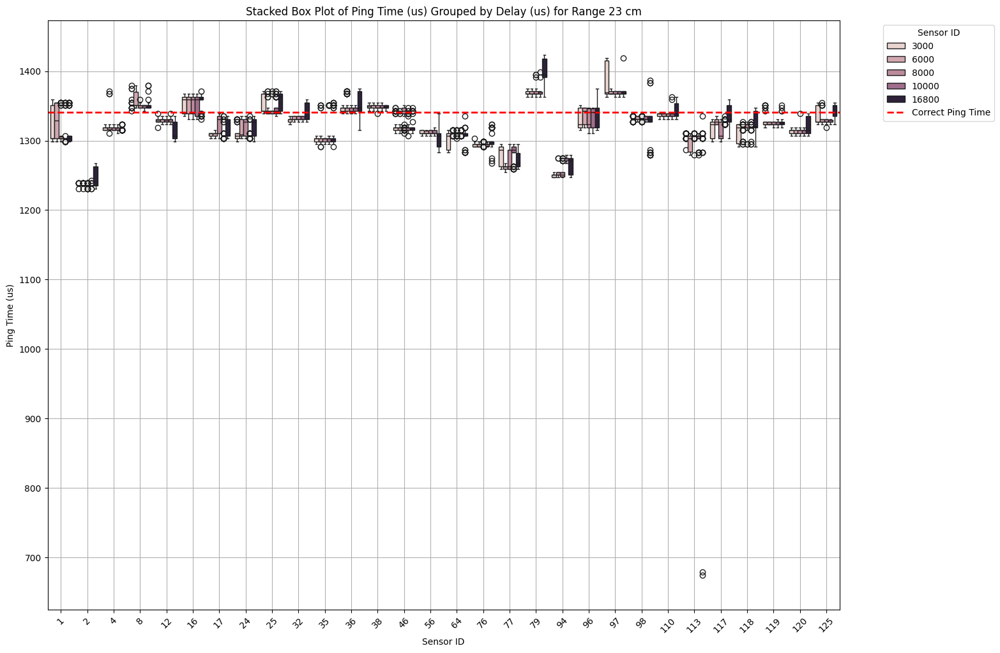

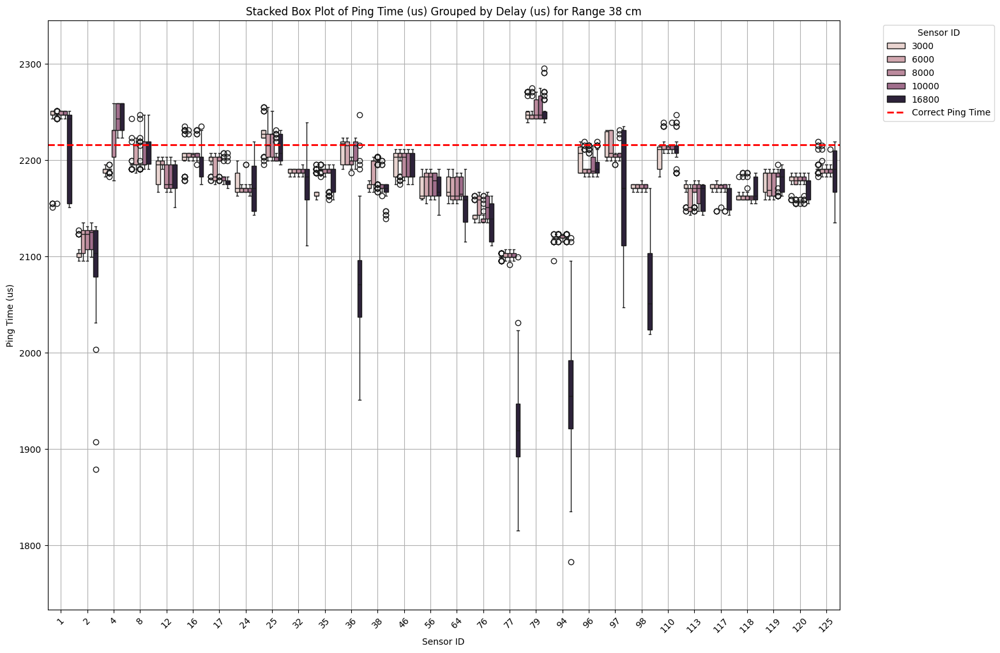

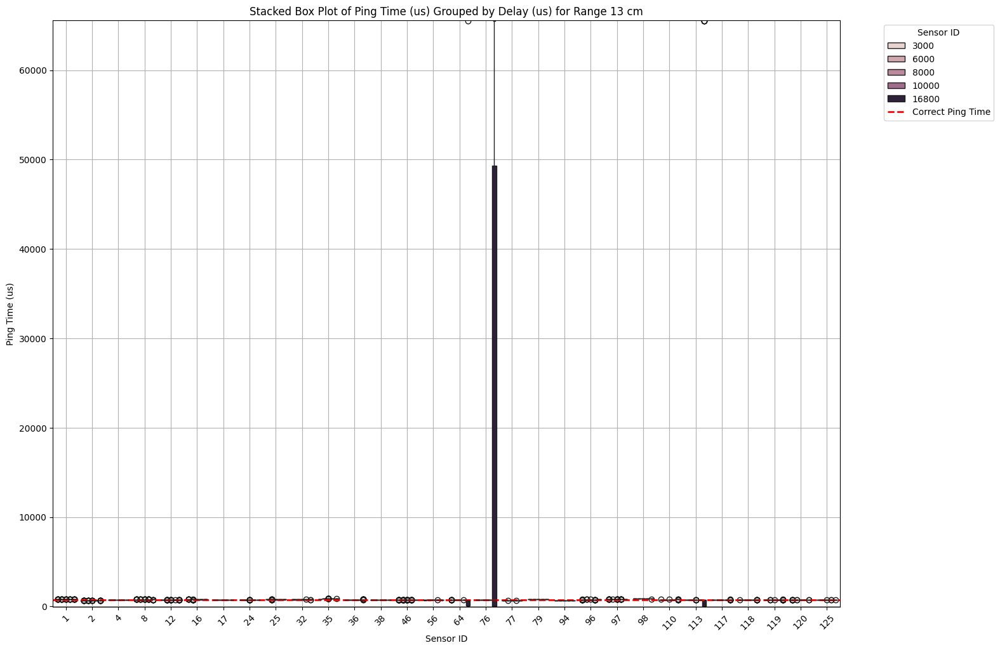

In [27]:
visualize_stacked_box_plots(cleaned_df)

#### Getting data ready


Even though this project has a some aspect of anamoly detection we will separate lower bound and upper bound to do the analysis.

To do so we will use the box plot where it will take lower 25% and upper 25%.

In [28]:
def identify_and_remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_no_outliers = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    df_outliers_lower = df[(df[column] <= lower_bound)]
    df_outliers_upper = df[(df[column] >= upper_bound)]
    return df_no_outliers,df_outliers_lower,df_outliers_upper

To remove outliers it will be done by groups where we group by 'Sensor ID', 'Delay (us)' and 'Range (cm)'. 
This will treat one stationary data collection done during sequence data collection command as a group and from those group we will identify outliers.

This will ensure fairness of removing process rather than doing as a whole.

In [29]:
# Group the data by 'Sensor ID', 'Delay (us)', and 'Range (cm)'
cleaned_data = cleaned_df.copy()
grouped = cleaned_data.groupby(['Sensor ID', 'Delay (us)', 'Range (cm)'])

# Identify and remove outliers for each group
middle_quartile = []
lower_quartile = []
upper_quartile = []

for name, group in grouped:
    cleaned_group = group.copy()
    for column in ['Ping Time (us)']:
        middle_quartile_group,lower_quartile_group,upper_quartile_group = identify_and_remove_outliers(cleaned_group, column)
    middle_quartile.append(middle_quartile_group)
    lower_quartile.append(lower_quartile_group)
    upper_quartile.append(upper_quartile_group)

In [30]:
# Combine the cleaned groups into a single DataFrame
df_removed_outliers = pd.concat(middle_quartile)
df_outliers_lower = pd.concat(lower_quartile)
df_outliers_upper = pd.concat(upper_quartile)

Result of the split

In [31]:
df_removed_outliers

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm),side g (cm)
64551,1,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64552,2,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64553,3,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64554,4,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64555,5,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184926,45,3972,53.46,3047,16800,0.0,1,125,53,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
184927,46,3972,53.53,3051,16800,0.0,1,125,53,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
184928,47,3936,53.04,3023,16800,0.0,1,125,53,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
184929,48,3940,52.96,3019,16800,0.0,1,125,53,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN


In [32]:
df_outliers_lower

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm),side g (cm)
64550,0,6084,14.44,823,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64551,1,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64552,2,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64553,3,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64554,4,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185407,26,3348,42.72,2435,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185410,29,3352,42.79,2439,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185422,41,3364,42.79,2439,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185430,49,3352,42.72,2435,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN


In [33]:
df_outliers_upper

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm),side g (cm)
64551,1,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64552,2,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64553,3,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64554,4,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64555,5,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184979,48,13636,53.88,3071,10000,0.0,1,125,53,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185384,3,3408,43.63,2487,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185391,10,3412,43.63,2487,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185408,27,3404,43.70,2491,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN


#### Visualize Effect of delay and range

This will show how middle quartile where there are no outliers would portray similar shape of graphs. 

In [34]:
# visualize sensor 1
visualize_effect_on_ping_time_sensors(df_removed_outliers,47)
visualize_effect_on_ping_time_sensors(cleaned_df,47)

In [80]:
# visualize sensor 2
visualize_effect_on_ping_time_sensors(df_removed_outliers,37)
visualize_effect_on_ping_time_sensors(cleaned_df,37)

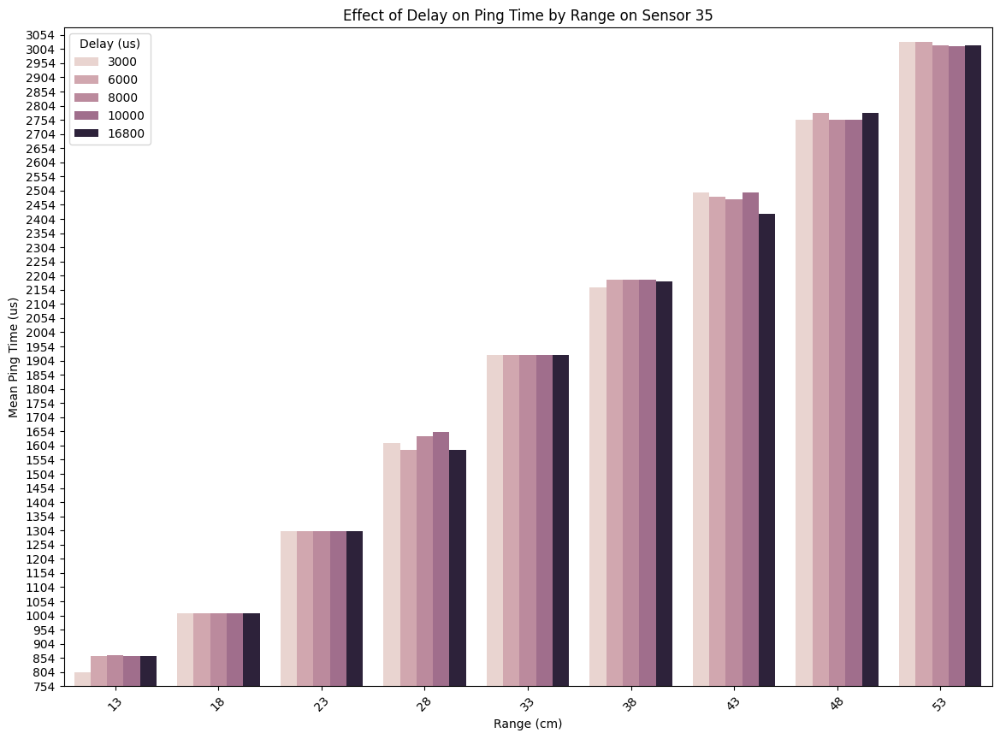

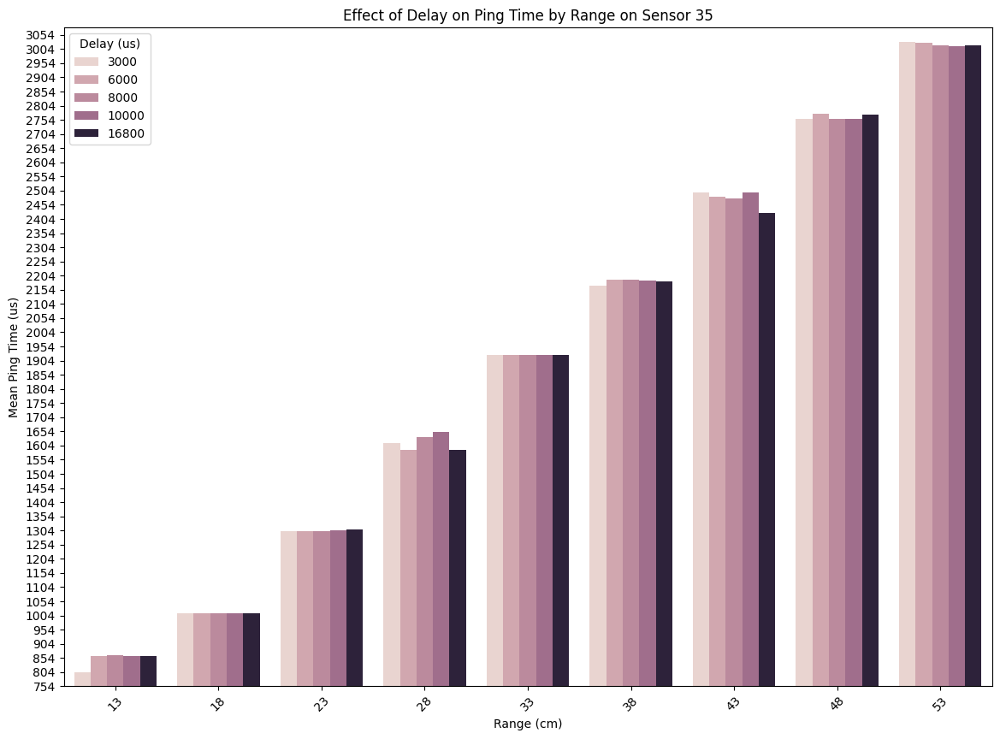

In [81]:
visualize_effect_on_ping_time_sensors(df_removed_outliers,35)
visualize_effect_on_ping_time_sensors(cleaned_df,35)

Removing the upper and lower bound didn't really affect much. However they marginalize it better

In [82]:
visualize_lineplot_ping_time_with_variability(df_removed_outliers)

So it cuts out variability but some still has it. this lead us to investigate lower and upper bounds 

### Investigate lower and upper bounds

From this analysis we will see if they will express characters

In [83]:
df_outliers_lower

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm),side g (cm)
64550,0,6084,14.44,823,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64551,1,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64552,2,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64553,3,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64554,4,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185407,26,3348,42.72,2435,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185410,29,3352,42.79,2439,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185422,41,3364,42.79,2439,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185430,49,3352,42.72,2435,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN


In [84]:
df_outliers_upper

,Trial,Ping Duration,Distance (cm),Ping Time (us),Delay (us),Steps,Arduino ID,Sensor ID,Range (cm),Sensor length (cm),...,side a (cm),side b (cm),side c (cm),Angle on YZ plane,Sensor Configuration,Sensor Angle,Surface material,Surface Length (cm),Surface Width (cm),side g (cm)
64551,1,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64552,2,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64553,3,6096,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64554,4,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
64555,5,6092,14.51,827,3000,10440.0,1,1,13,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184979,48,13636,53.88,3071,10000,0.0,1,125,53,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185384,3,3408,43.63,2487,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185391,10,3412,43.63,2487,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN
185408,27,3404,43.70,2491,16800,2610.0,1,125,43,0.8,...,18.3,18.3,0,0,HTR,90,wood,31,30.5,NaN


#### Visualize the lower bound and upper bound effect on ping time

First we will look at the effect on ping time graph

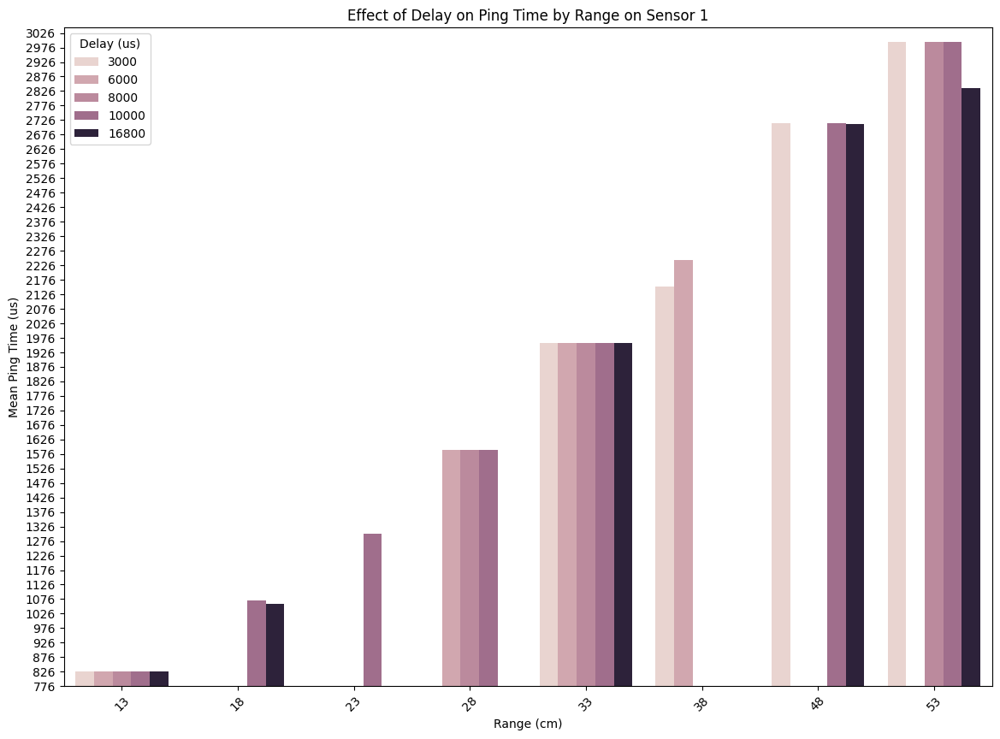

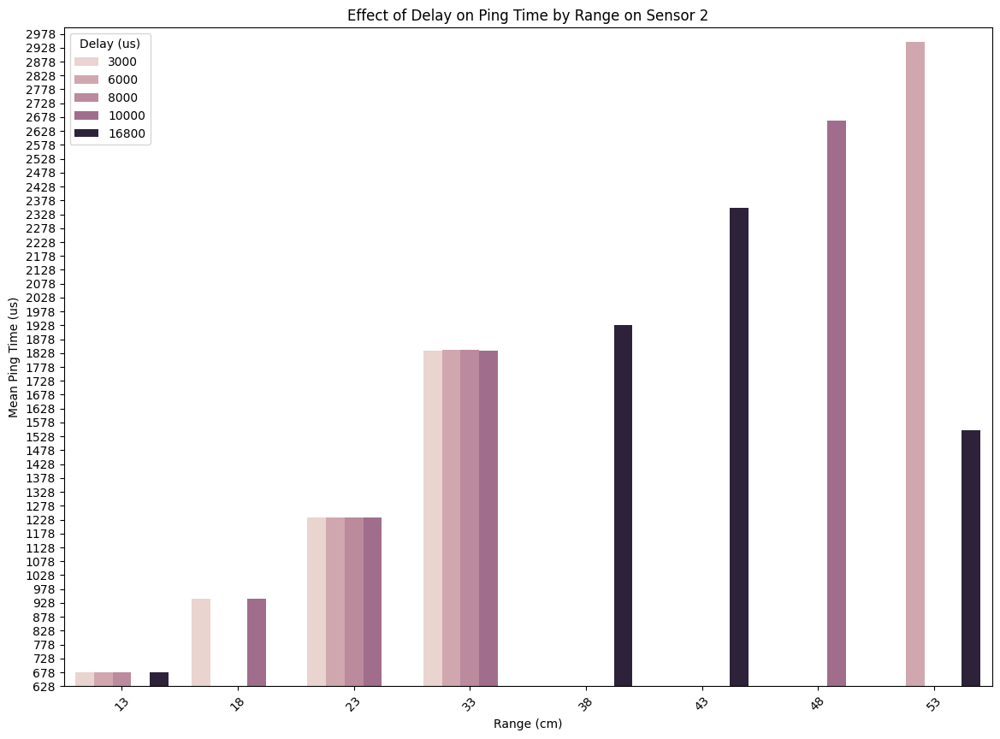

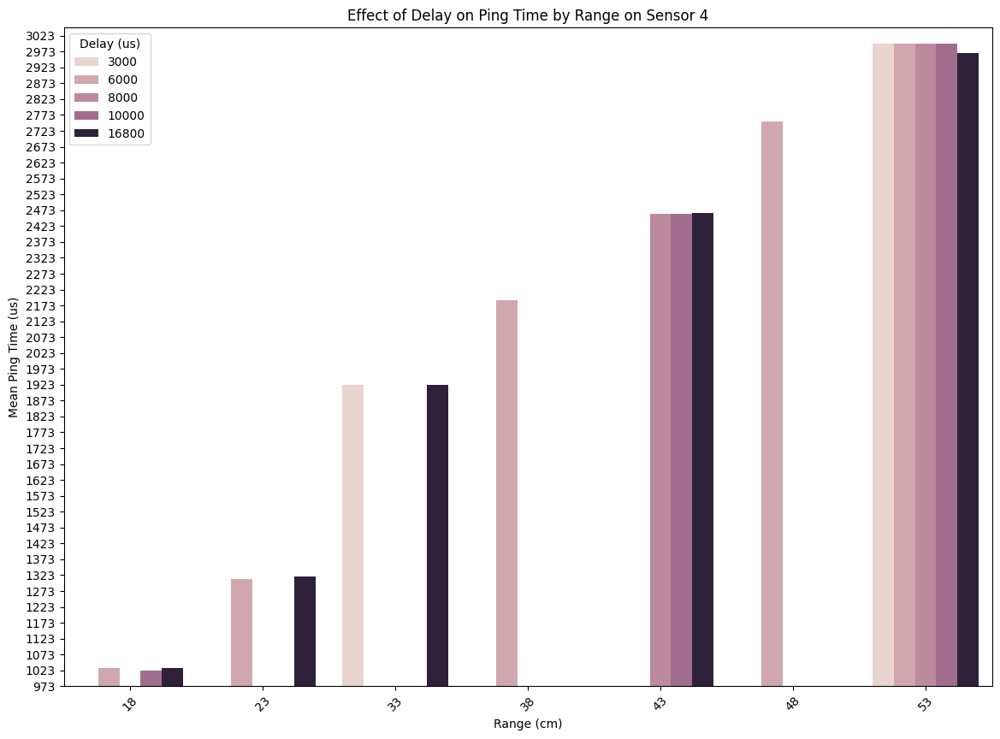

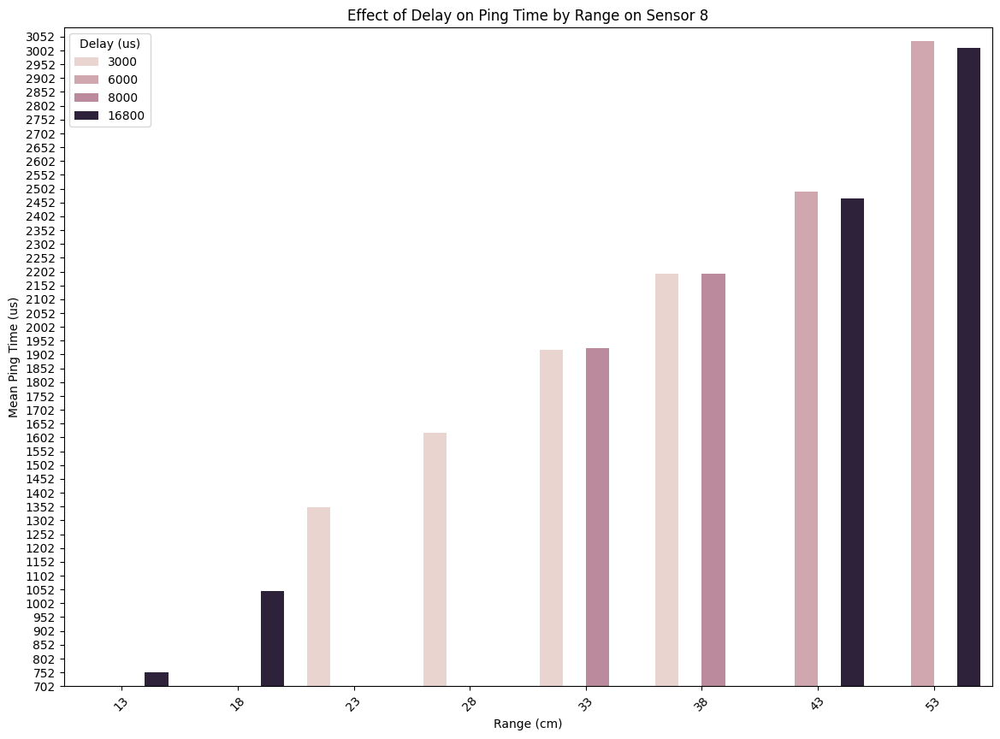

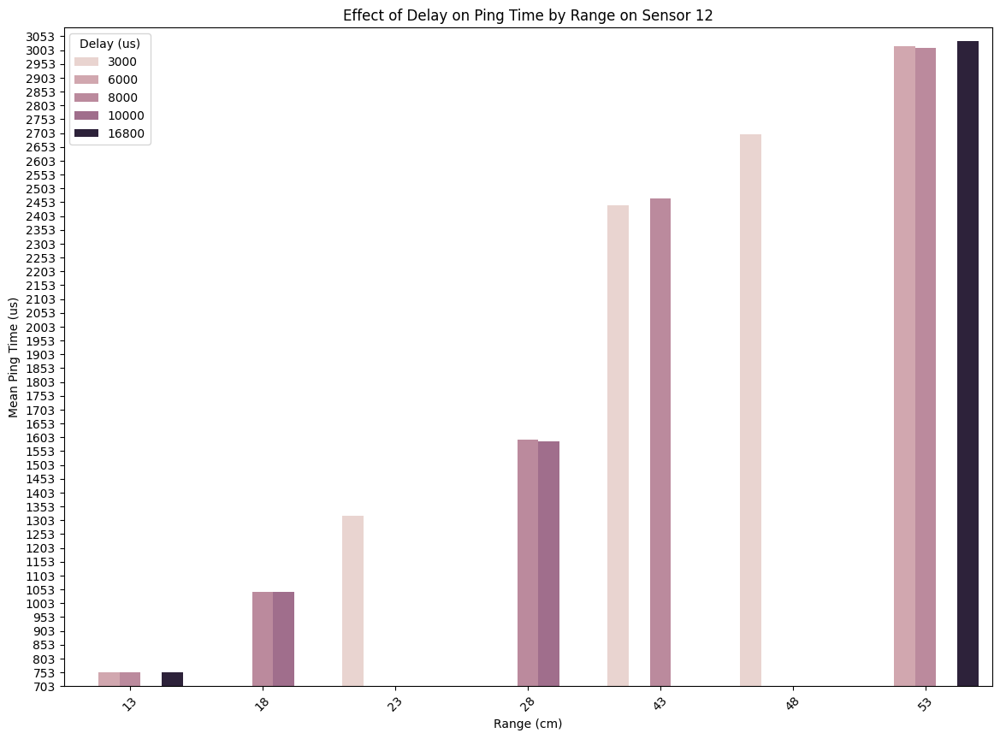

...

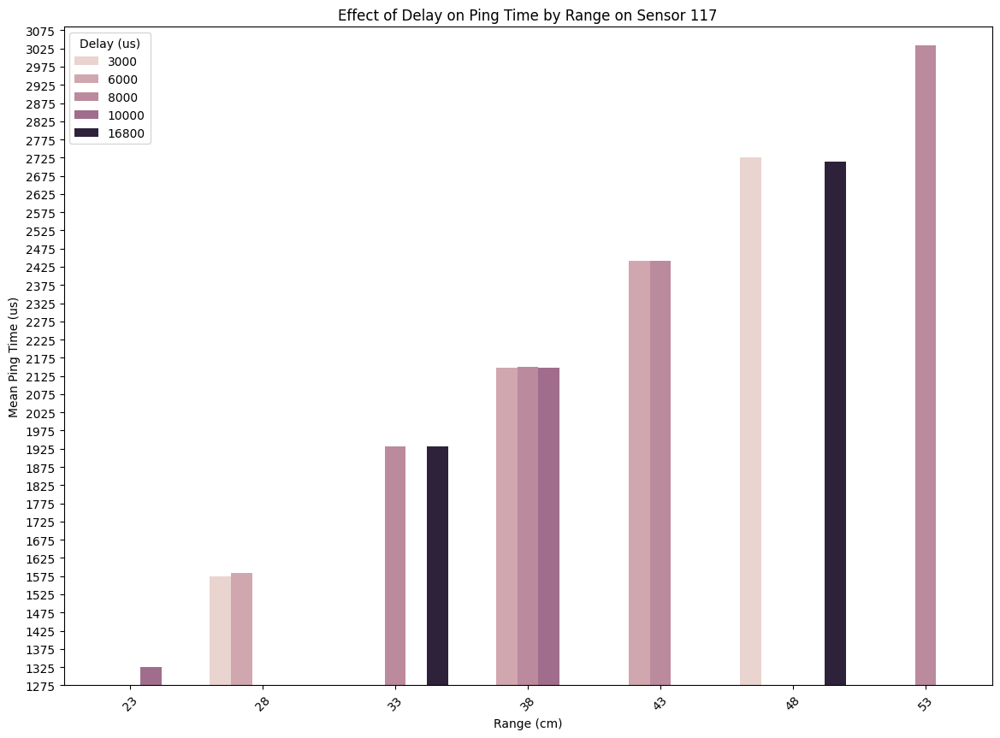

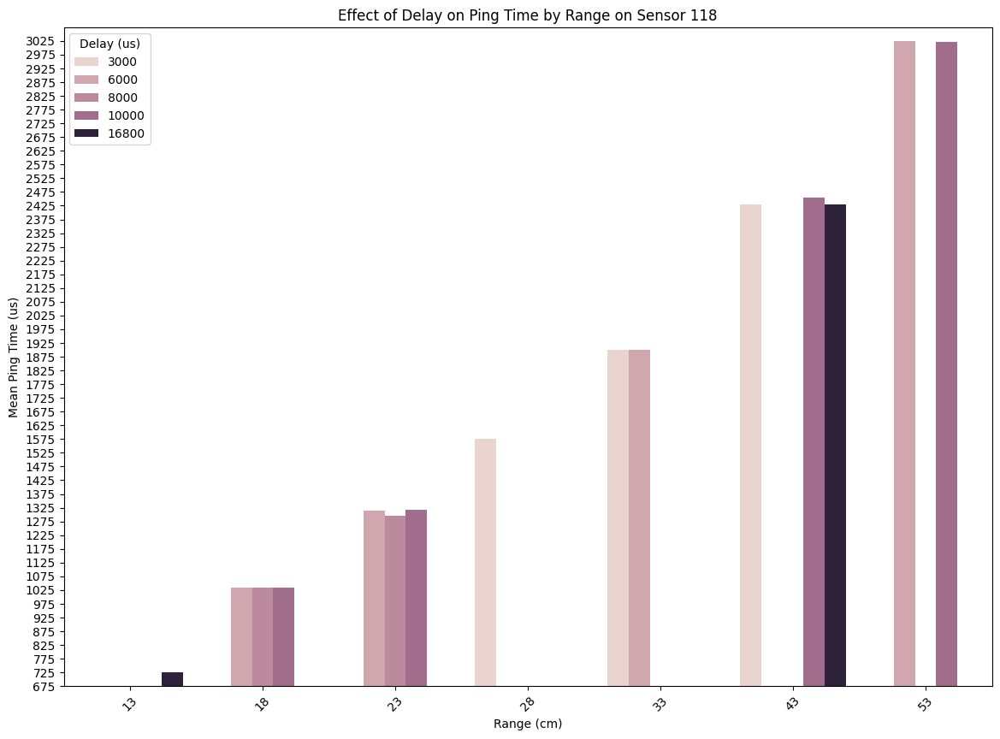

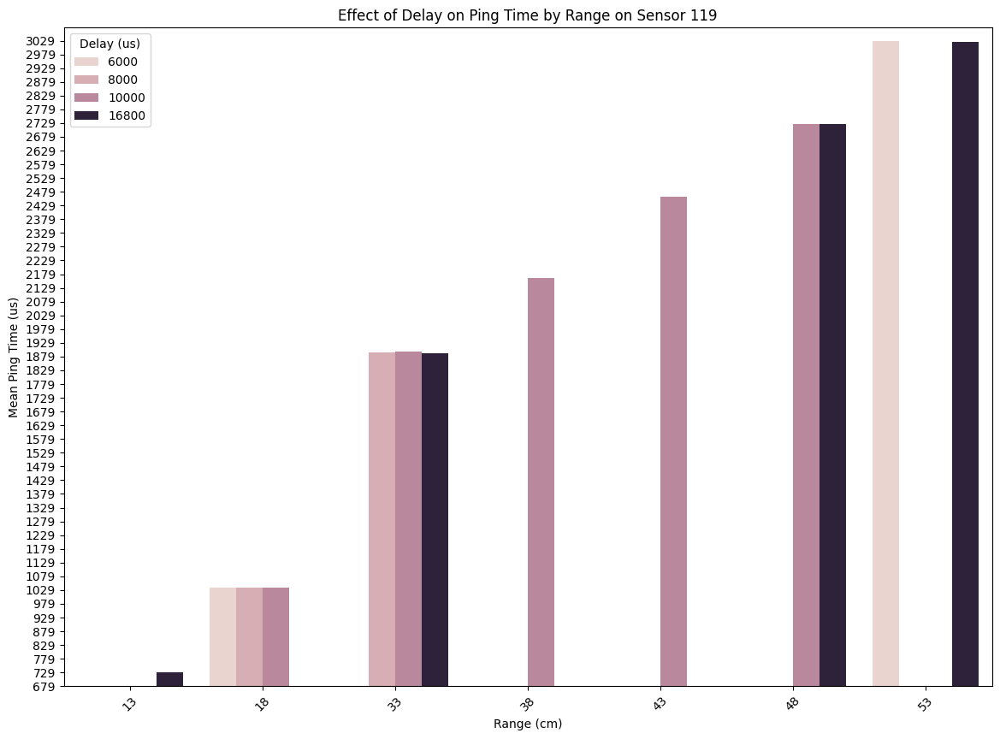

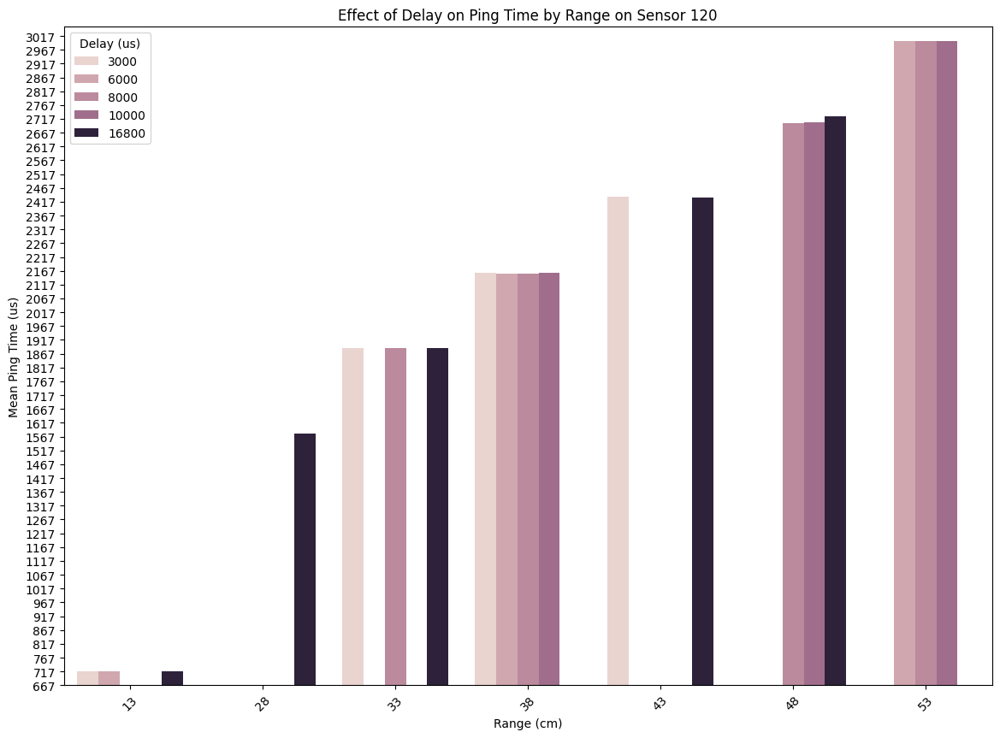

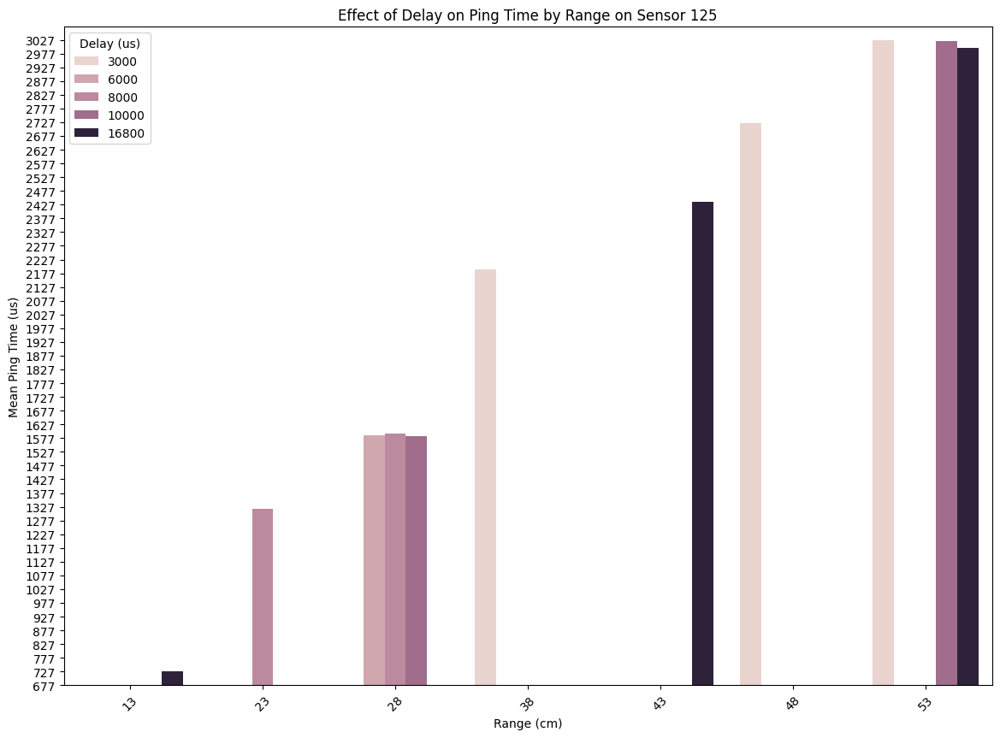

In [85]:
visualize_effect_on_ping_time_sensors(df_outliers_lower)

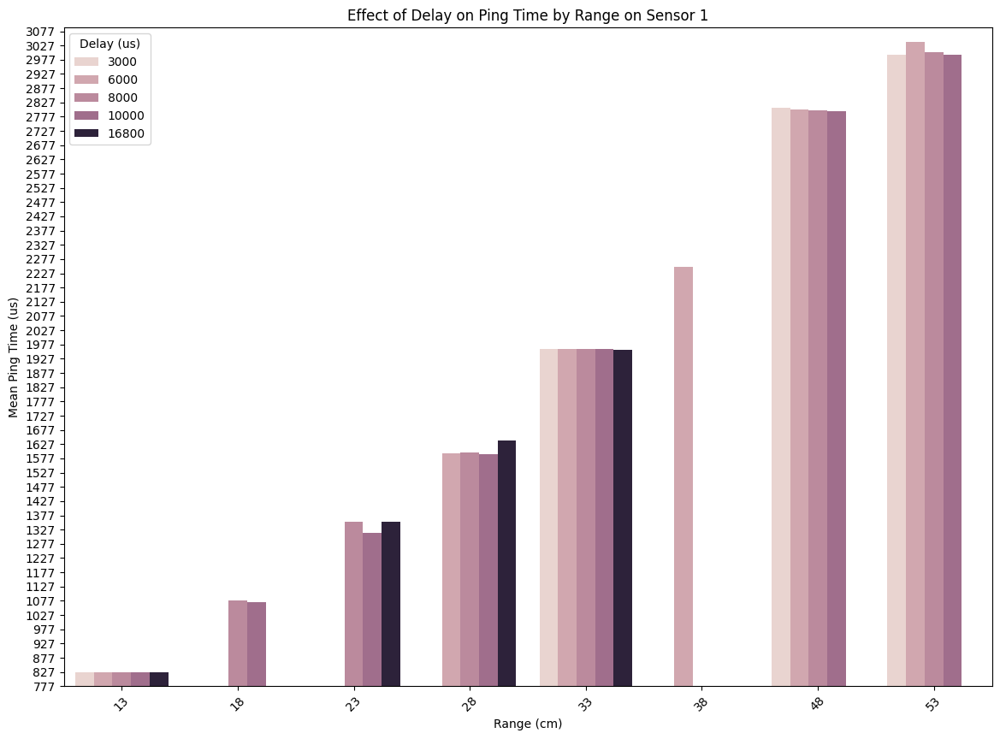

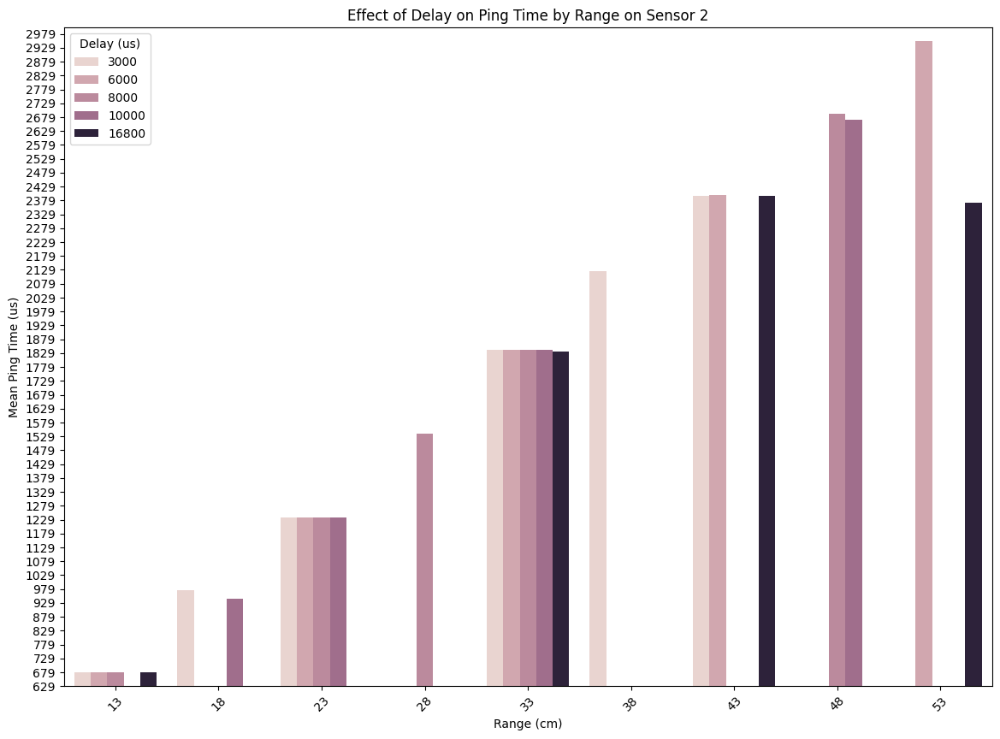

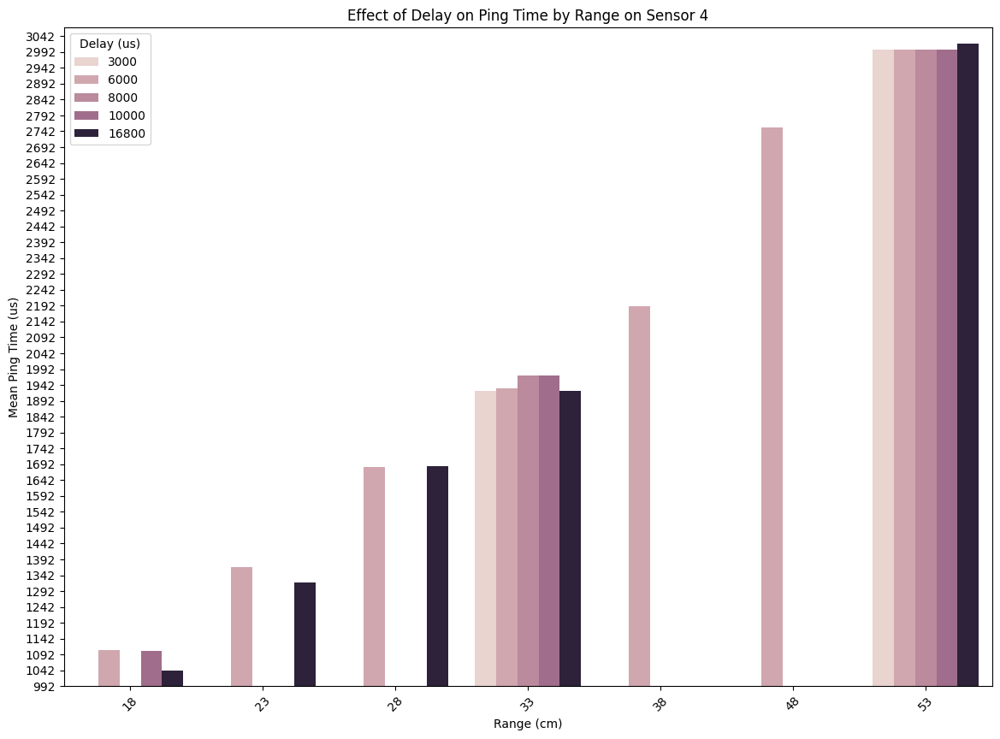

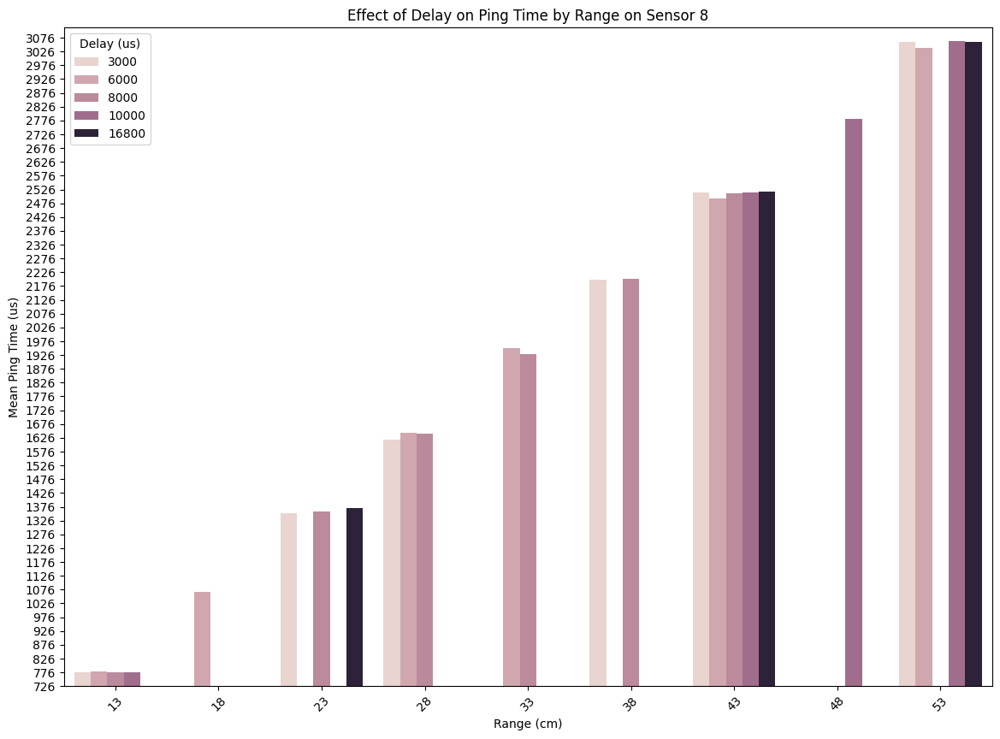

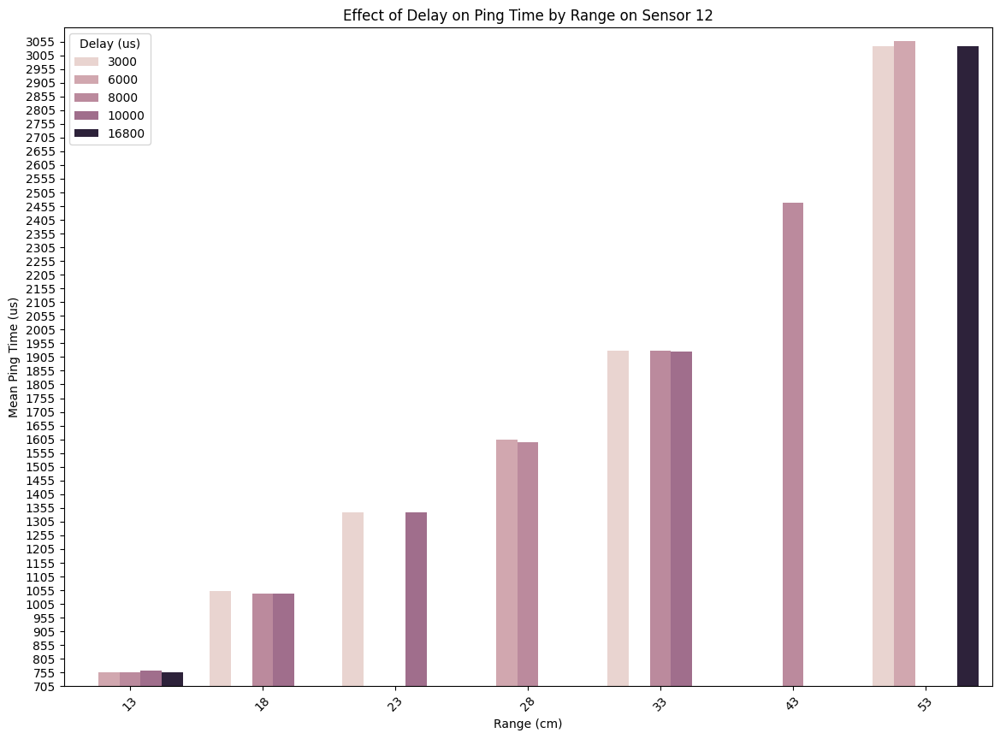

...

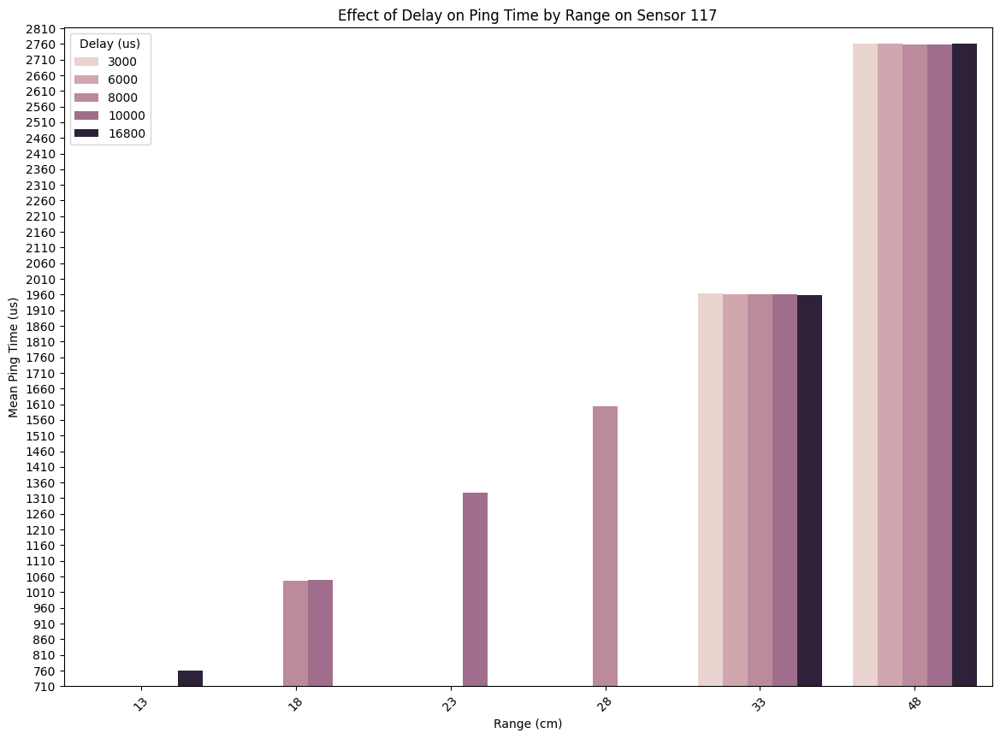

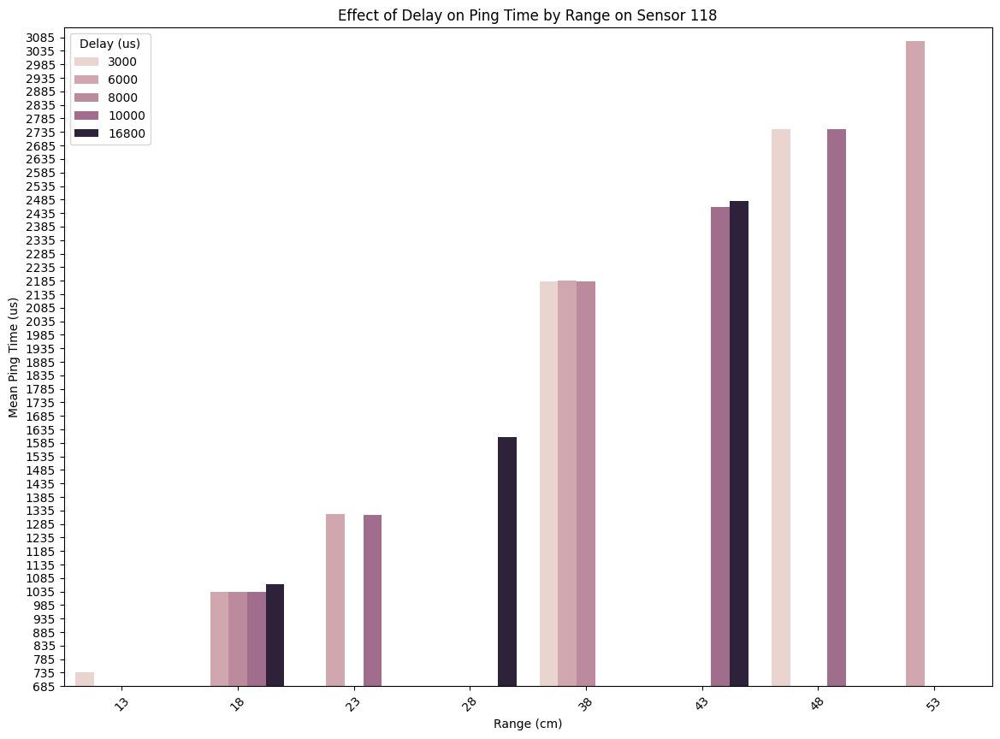

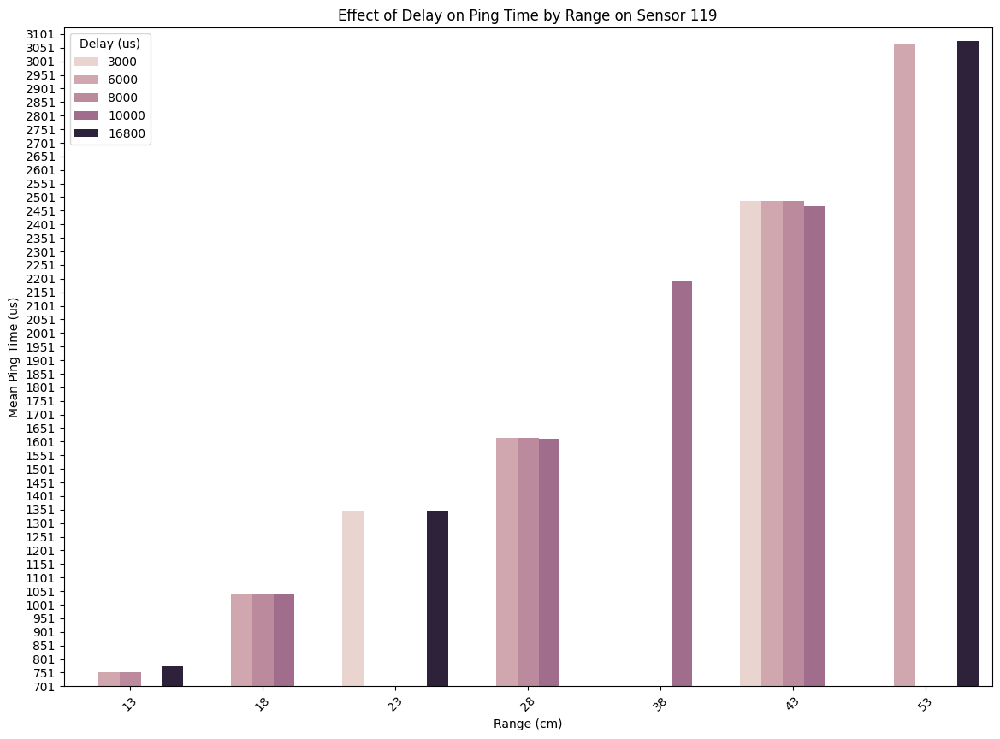

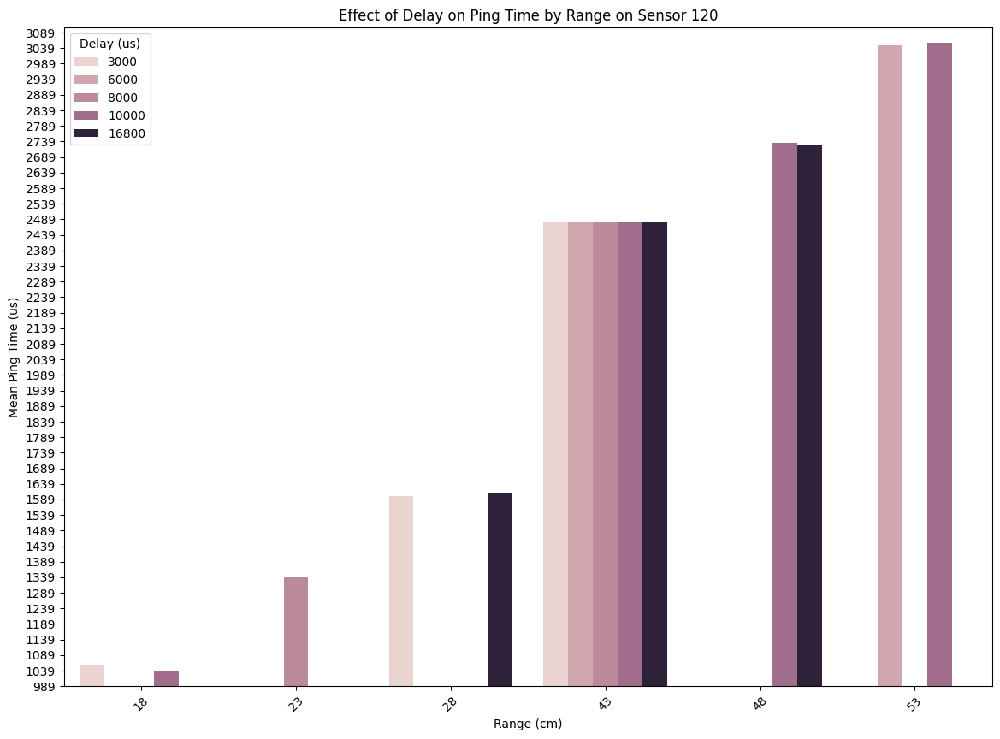

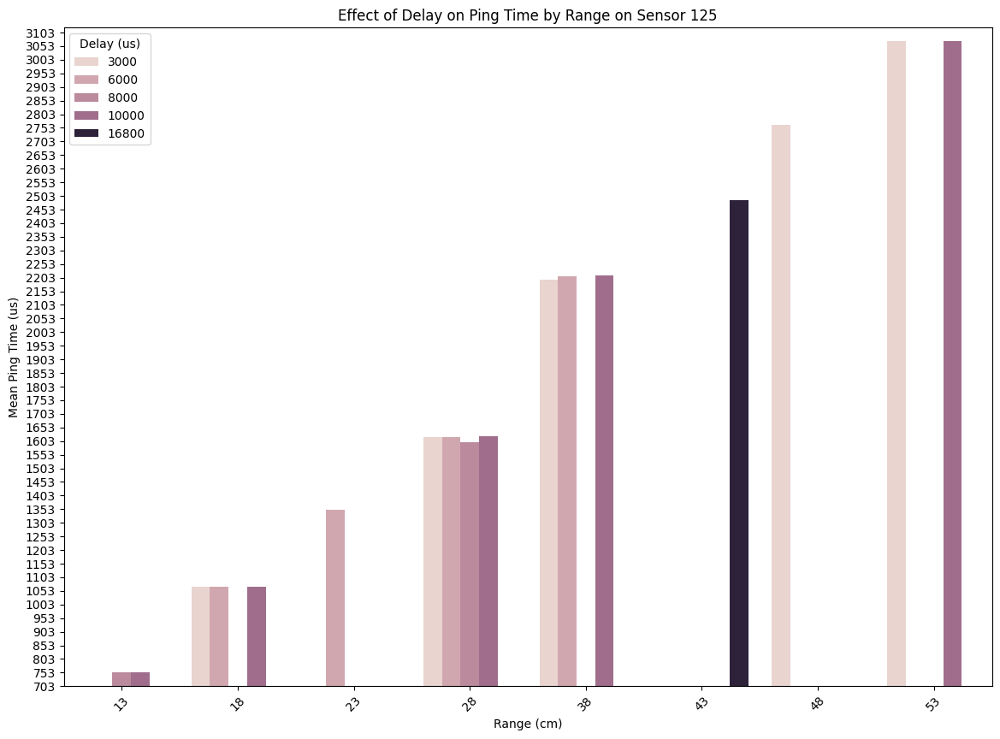

In [86]:
visualize_effect_on_ping_time_sensors(df_outliers_upper)

It does have some different patterns for each sensors this info might also be considered to be used later for characterization.

another thing that are noticable is the frequency and next we will be investigating on frequency

In [87]:
visualize_lineplot_ping_time_with_variability(df_outliers_lower)

In [88]:
visualize_lineplot_ping_time_with_variability(df_outliers_upper)

Some may start from certain range and even they don't have the line at all. Also this shows more variability within the data which characteristics. 

#### Investigate Frequency on lower and upper bound

In [89]:
df_outliers_lower.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count()

Sensor ID  Delay (us)
1          3000          140
           6000          171
           8000          167
           10000         267
           16800         102
                        ... 
125        3000           54
           6000            2
           8000           42
           10000          13
           16800           7
Name: Ping Time (us), Length: 144, dtype: int64

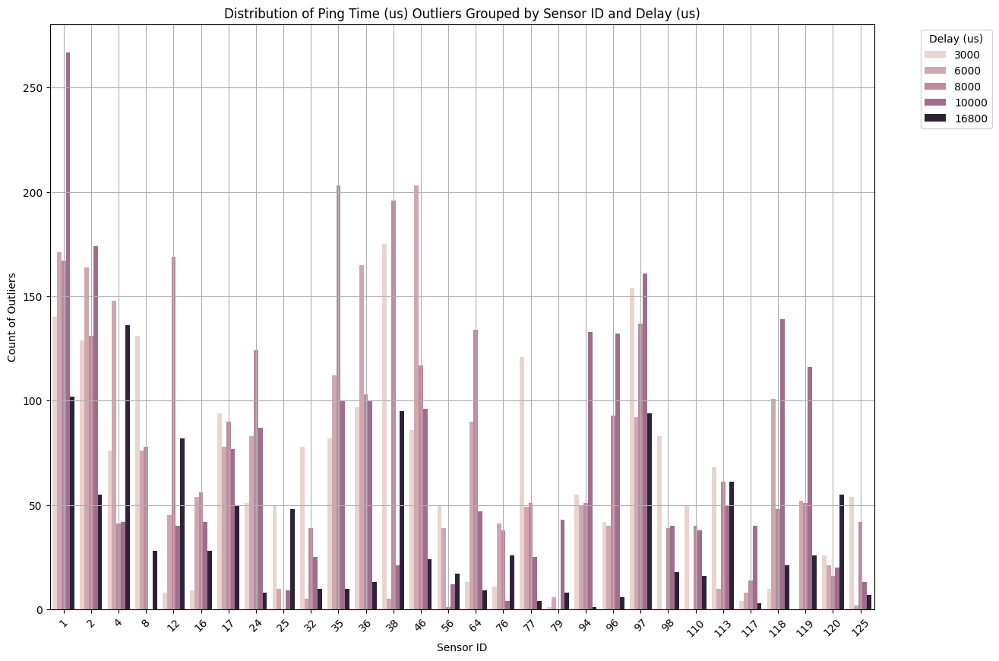

In [90]:
# Group the outliers by 'Sensor ID' and 'Delay (us)'
grouped_outliers = df_outliers_lower.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count().reset_index()

# Plot the distribution of outliers
plt.figure(figsize=(14, 10))
sns.barplot(
    x='Sensor ID', 
    y='Ping Time (us)', 
    hue='Delay (us)', 
    data=grouped_outliers
)
plt.title('Distribution of Ping Time (us) Outliers Grouped by Sensor ID and Delay (us)')
plt.xlabel('Sensor ID')
plt.ylabel('Count of Outliers')
plt.legend(title='Delay (us)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [91]:
df_outliers_upper.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count()

Sensor ID  Delay (us)
1          3000          131
           6000          182
           8000          197
           10000         258
           16800         105
                        ... 
125        3000           54
           6000           22
           8000           39
           10000          16
           16800           4
Name: Ping Time (us), Length: 146, dtype: int64

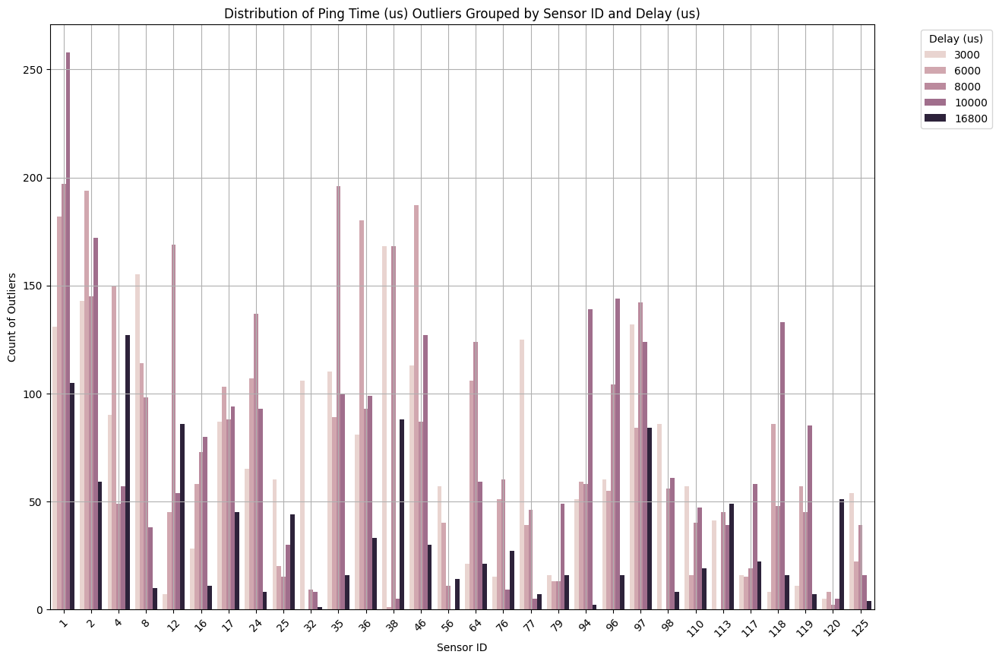

In [92]:
# Group the outliers by 'Sensor ID' and 'Delay (us)'
grouped_upper_outliers = df_outliers_upper.groupby(['Sensor ID', 'Delay (us)'])['Ping Time (us)'].count().reset_index()

# Plot the distribution of outliers
plt.figure(figsize=(14, 10))
sns.barplot(
    x='Sensor ID', 
    y='Ping Time (us)', 
    hue='Delay (us)', 
    data=grouped_upper_outliers
)
plt.title('Distribution of Ping Time (us) Outliers Grouped by Sensor ID and Delay (us)')
plt.xlabel('Sensor ID')
plt.ylabel('Count of Outliers')
plt.legend(title='Delay (us)', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

# Visualize Sensor Colours

In [93]:
cleaned_df.columns

Index(['Trial', 'Ping Duration', 'Distance (cm)', 'Ping Time (us)',
       'Delay (us)', 'Steps', 'Arduino ID', 'Sensor ID', 'Range (cm)',
       'Sensor length (cm)', 'Color of sensor', 'Angle on XY plane',
       'side a (cm)', 'side b (cm)', 'side c (cm)', 'Angle on YZ plane',
       'Sensor Configuration', 'Sensor Angle', 'Surface material',
       'Surface Length (cm)', 'Surface Width (cm)', 'side g (cm)'],
      dtype='object')

In [94]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

def visualize_lineplot_ping_time_with_variability(df):
    """
    Visualize the effect of range on ping time for each delay separately with variability.

    Parameters:
    df (DataFrame): The DataFrame containing the data.
    """
    # Group by color, delay, and range, then calculate the mean and standard deviation of ping time
    grouped_df = df.groupby(['Color of sensor', 'Delay (us)', 'Range (cm)']).agg(
        mean_ping_time=('Ping Time (us)', 'mean'),
        std_ping_time=('Ping Time (us)', 'std')
    ).reset_index()

    # Get unique delays
    unique_delays = grouped_df['Delay (us)'].unique()

    for delay in unique_delays:
        subset_df = grouped_df[grouped_df['Delay (us)'] == delay]

        fig = px.line(
            subset_df,
            x='Range (cm)',
            y='mean_ping_time',
            color='Color of sensor',
            markers=True,
            title=f'Effect of Range on Ping Time for Delay {delay} us with Variability'
        )

        # Adding error bars
        for color in subset_df['Color of sensor'].unique():
            color_data = subset_df[subset_df['Color of sensor'] == color]
            fig.add_trace(
                go.Scatter(
                    x=color_data['Range (cm)'],
                    y=color_data['mean_ping_time'],
                    mode='lines+markers',
                    name=f'Color of sensor {color}',
                    error_y=dict(
                        type='data',
                        array=color_data['std_ping_time'],
                        visible=True
                    )
                )
            )

        # Plot reference line
        ranges = np.linspace(subset_df['Range (cm)'].min(), subset_df['Range (cm)'].max(), 100)
        reference_ping_times = 57 * ranges
        fig.add_trace(
            go.Scatter(
                x=ranges,
                y=reference_ping_times,
                mode='lines',
                line=dict(color='red', dash='dash'),
                name='Reference Line'
            )
        )

        fig.update_layout(
            xaxis_title='Range (cm)',
            yaxis_title='Mean Ping Time (us)',
            legend_title='Color',
            template='plotly_white'
        )

        fig.show()

# Call the function to visualize the plot
visualize_lineplot_ping_time_with_variability(cleaned_df)


Seems like when colour of sensor is green it seems like they show trend that doesnt fit the reference line.

but this may be due to the lack of sample since this curve is similar to sensor id 37

In [95]:
cleaned_df[cleaned_df["Color of sensor"]== "g"]["Sensor ID"].unique()

array([ 8, 17,  4, 97, 96, 98, 25, 79, 77, 24])

Given there are only two samples for the green sensor it is hard to make a conclusion.

# Further ideas

Ideas for feature engineering:
- new features related to IQR methods: range_delay_middle, range_delay_lower,range_delay_upper
- Another features which is a product of IQR method: lower_delay_freq and upper_delay_freq 

Ideas for characterization:
- Do feature importance to find out which features are important features like L1... but theres no target. 
- Use anamoly detection without labels -> we can use clustering methods